# Multimodal Data Preprocessing Assignment

## Task 1: Data Merge and Exploratory Data Analysis

In this notebook, we'll merge customer social profiles and transaction data, then perform exploratory data analysis to prepare for building a predictive model.

In [3]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set visualization style
plt.style.use('seaborn-v0_8-white')
sns.set_palette('viridis')

# Display settings
%matplotlib inline
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)

### 1.1 Load the Datasets

In [4]:
# Load customer social profiles
social_profiles = pd.read_excel('customer_social_profiles.xlsx')

# Load customer transactions
transactions = pd.read_excel('customer_transactions.xlsx')

# Display the first few rows of each dataset
print("Customer Social Profiles:")
display(social_profiles.head())

print("\nCustomer Transactions:")
display(transactions.head())

# Dataset dimensions
print(f"Social profiles shape: {social_profiles.shape}")
print(f"Transactions shape: {transactions.shape}")

Customer Social Profiles:


,customer_id_new,social_media_platform,engagement_score,purchase_interest_score,review_sentiment
0,A178,LinkedIn,74,4.9,Positive
1,A190,Twitter,82,4.8,Neutral
2,A150,Facebook,96,1.6,Positive
3,A162,Twitter,89,2.6,Positive
4,A197,Twitter,92,2.3,Neutral



Customer Transactions:


,customer_id_legacy,transaction_id,purchase_amount,purchase_date,product_category,customer_rating
0,151,1001,408,2024-01-01,Sports,2.3
1,192,1002,332,2024-01-02,Electronics,4.2
2,114,1003,442,2024-01-03,Electronics,2.1
3,171,1004,256,2024-01-04,Clothing,2.8
4,160,1005,64,2024-01-05,Clothing,1.3


Social profiles shape: (155, 5)
Transactions shape: (150, 6)


### 1.2 Exploratory Data Analysis - Summary Statistics

In [5]:
# Summary statistics for social profiles
print("Social Profiles Summary Statistics:")
display(social_profiles.describe(include='all').T)

# Summary statistics for transactions
print("\nTransactions Summary Statistics:")
display(transactions.describe(include='all').T)

# Check unique values in categorical columns
print('\nSocial Media Platforms:', social_profiles['social_media_platform'].unique())
print('Review Sentiments:', social_profiles['review_sentiment'].unique())
print('Product Categories:', transactions['product_category'].unique())

Social Profiles Summary Statistics:


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
customer_id_new,155,84,A155,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN
social_media_platform,155,5,Twitter,38,NaN,NaN,NaN,NaN,NaN,NaN,NaN
engagement_score,155.0,NaN,NaN,NaN,75.606452,14.568021,50.0,63.5,77.0,87.5,99.0
purchase_interest_score,155.0,NaN,NaN,NaN,3.152903,1.142867,1.0,2.35,3.2,4.1,5.0
review_sentiment,155,3,Positive,63,NaN,NaN,NaN,NaN,NaN,NaN,NaN



Transactions Summary Statistics:


,count,unique,top,freq,mean,min,25%,50%,75%,max,std
customer_id_legacy,150.0,NaN,NaN,NaN,148.76,100.0,121.25,150.5,174.75,199.0,30.046425
transaction_id,150.0,NaN,NaN,NaN,1075.5,1001.0,1038.25,1075.5,1112.75,1150.0,43.445368
purchase_amount,150.0,NaN,NaN,NaN,280.78,51.0,179.0,274.0,388.5,495.0,121.329595
purchase_date,150,NaN,NaN,NaN,2024-03-15 12:00:00,2024-01-01 00:00:00,2024-02-07 06:00:00,2024-03-15 12:00:00,2024-04-21 18:00:00,2024-05-29 00:00:00,NaN
product_category,150,5,Sports,35,NaN,NaN,NaN,NaN,NaN,NaN,NaN
customer_rating,140.0,NaN,NaN,NaN,2.985,1.0,1.95,3.0,4.0,5.0,1.20699



Social Media Platforms: ['LinkedIn' 'Twitter' 'Facebook' 'TikTok' 'Instagram']
Review Sentiments: ['Positive' 'Neutral' 'Negative']
Product Categories: ['Sports' 'Electronics' 'Clothing' 'Groceries' 'Books']


In [6]:
# Check data types and missing values in social profiles
print("Social Profiles Data Types:")
display(social_profiles.dtypes)
print("\nSocial Profiles Missing Values:")
display(social_profiles.isnull().sum())

# Check data types and missing values in transactions
print("\nTransactions Data Types:")
display(transactions.dtypes)
print("\nTransactions Missing Values:")
display(transactions.isnull().sum())

# Check for duplicates
print(f"\nDuplicates in social profiles: {social_profiles.duplicated().sum()}")
print(f"Duplicates in transactions: {transactions.duplicated().sum()}")

# Check for duplicates in customer IDs
print(f"Duplicates in social profiles customer_id_new: {social_profiles['customer_id_new'].duplicated().sum()}")
print(f"Duplicates in transactions customer_id_legacy: {transactions['customer_id_legacy'].duplicated().sum()}")

Social Profiles Data Types:


customer_id_new             object
social_media_platform       object
engagement_score             int64
purchase_interest_score    float64
review_sentiment            object
dtype: object


Social Profiles Missing Values:


customer_id_new            0
social_media_platform      0
engagement_score           0
purchase_interest_score    0
review_sentiment           0
dtype: int64


Transactions Data Types:


customer_id_legacy             int64
transaction_id                 int64
purchase_amount                int64
purchase_date         datetime64[ns]
product_category              object
customer_rating              float64
dtype: object


Transactions Missing Values:


customer_id_legacy     0
transaction_id         0
purchase_amount        0
purchase_date          0
product_category       0
customer_rating       10
dtype: int64


Duplicates in social profiles: 5
Duplicates in transactions: 0
Duplicates in social profiles customer_id_new: 71
Duplicates in transactions customer_id_legacy: 75


### 1.3 Data Visualization

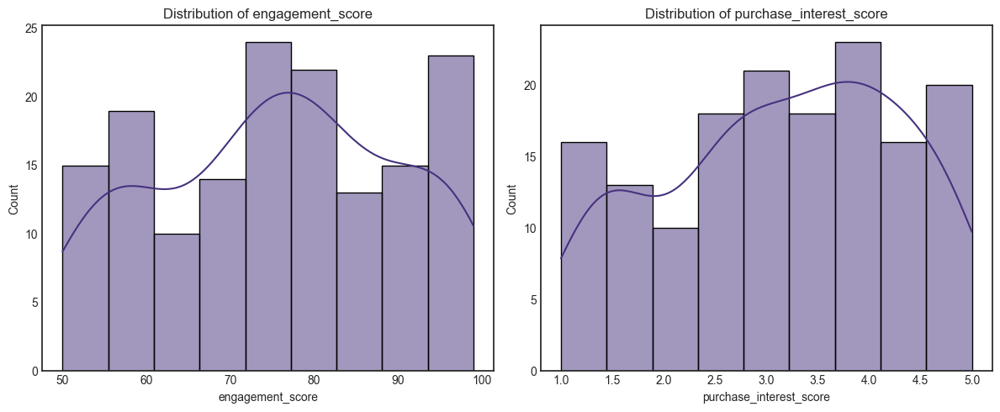

In [7]:
# Visualization 1: Distribution of numerical features in social profiles
plt.figure(figsize=(12, 5))
for i, col in enumerate(social_profiles.select_dtypes(include=['int64', 'float64']).columns):
    plt.subplot(1, 2, i+1)
    sns.histplot(social_profiles[col], kde=True)
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()

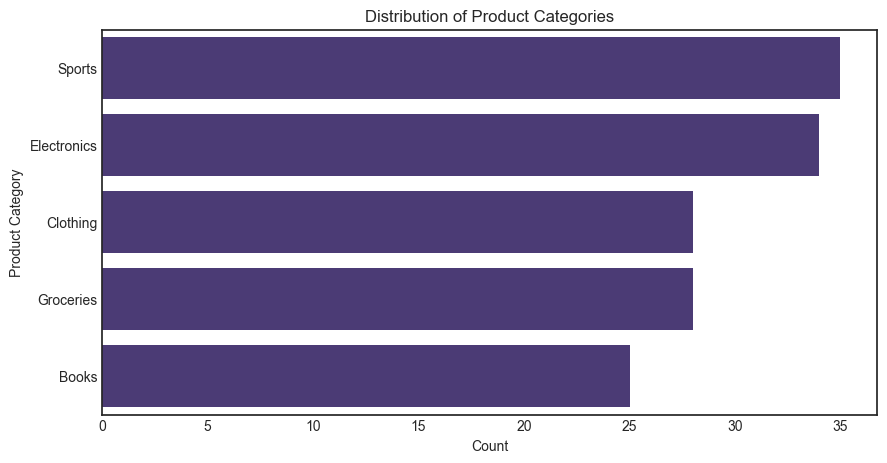

In [8]:
# Visualization 2: Distribution of product categories in transactions
plt.figure(figsize=(10, 5))
sns.countplot(y=transactions['product_category'], order=transactions['product_category'].value_counts().index)
plt.title('Distribution of Product Categories')
plt.xlabel('Count')
plt.ylabel('Product Category')
plt.show()

### 1.4 Analyzing Customer ID Relationship

In [9]:
import re

# Extract numeric part from customer_id_new
social_profiles['customer_id_num'] = social_profiles['customer_id_new'].apply(
    lambda x: int(re.search(r'A(\d+)', x).group(1))
)

# Check overlap between the two datasets
social_ids = set(social_profiles['customer_id_num'])
trans_ids = set(transactions['customer_id_legacy'])
overlap = social_ids.intersection(trans_ids)

print('Number of unique customer_id_num in social:', len(social_ids))
print('Number of unique customer_id_legacy in transactions:', len(trans_ids))
print('Number of overlapping IDs:', len(overlap))
print('Percentage of social profiles with matching transactions:', 
      round(len(overlap) / len(social_ids) * 100, 2), '%')
print('Percentage of transactions with matching social profiles:', 
      round(len(overlap) / len(trans_ids) * 100, 2), '%')

Number of unique customer_id_num in social: 84
Number of unique customer_id_legacy in transactions: 75
Number of overlapping IDs: 61
Percentage of social profiles with matching transactions: 72.62 %
Percentage of transactions with matching social profiles: 81.33 %


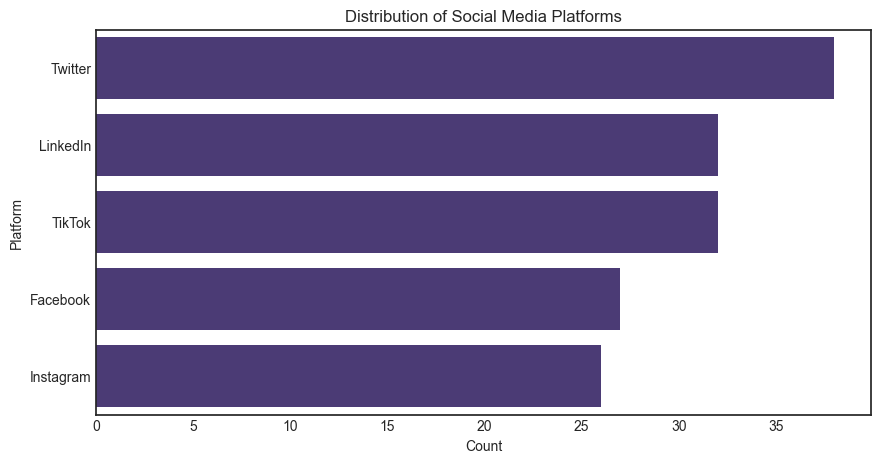

In [10]:
# Visualization 3: Distribution of social media platforms
plt.figure(figsize=(10, 5))
sns.countplot(y=social_profiles['social_media_platform'], 
             order=social_profiles['social_media_platform'].value_counts().index)
plt.title('Distribution of Social Media Platforms')
plt.xlabel('Count')
plt.ylabel('Platform')
plt.show()

### 1.5 Data Cleaning

In [11]:
# Handle missing values in social profiles
social_profiles_clean = social_profiles.copy()
print(f"Original social profiles shape: {social_profiles.shape}")

# Since we have duplicated customer IDs, let's keep only unique customer IDs
# We'll keep the first occurrence of each customer ID
social_profiles_clean = social_profiles_clean.drop_duplicates(subset=['customer_id_new'])
print(f"Social profiles shape after removing duplicate customer IDs: {social_profiles_clean.shape}")

# No missing values to handle in social profiles
print("\nMissing values in social profiles after cleaning:")
display(social_profiles_clean.isnull().sum())

Original social profiles shape: (155, 6)
Social profiles shape after removing duplicate customer IDs: (84, 6)

Missing values in social profiles after cleaning:


customer_id_new            0
social_media_platform      0
engagement_score           0
purchase_interest_score    0
review_sentiment           0
customer_id_num            0
dtype: int64

In [12]:
# Handle missing values and duplicates in transactions
transactions_clean = transactions.copy()
print(f"Original transactions shape: {transactions.shape}")

# Since we have duplicated customer IDs, let's aggregate transactions by customer
# We'll keep one row per customer with their most recent transaction
transactions_clean = transactions_clean.sort_values('purchase_date', ascending=False)
transactions_clean = transactions_clean.drop_duplicates(subset=['customer_id_legacy'])
print(f"Transactions shape after keeping most recent transaction per customer: {transactions_clean.shape}")

# Handle missing values in customer_rating
print(f"Missing customer ratings: {transactions_clean['customer_rating'].isnull().sum()}")
transactions_clean['customer_rating'] = transactions_clean['customer_rating'].fillna(
    transactions_clean['customer_rating'].median()
)

print("\nMissing values after cleaning:")
display(transactions_clean.isnull().sum())

Original transactions shape: (150, 6)
Transactions shape after keeping most recent transaction per customer: (75, 6)
Missing customer ratings: 6

Missing values after cleaning:


customer_id_legacy    0
transaction_id        0
purchase_amount       0
purchase_date         0
product_category      0
customer_rating       0
dtype: int64

### 1.6 Data Merge

In [13]:
# Identify the common key for merging
print("Social profiles columns:")
print(social_profiles_clean.columns.tolist())
print("\nTransactions columns:")
print(transactions_clean.columns.tolist())

# We'll merge on customer_id_num from social profiles and customer_id_legacy from transactions
print("\nSample of customer_id_num from social profiles:")
print(social_profiles_clean[['customer_id_new', 'customer_id_num']].head())

print("\nSample of customer_id_legacy from transactions:")
print(transactions_clean[['customer_id_legacy']].head())

Social profiles columns:
['customer_id_new', 'social_media_platform', 'engagement_score', 'purchase_interest_score', 'review_sentiment', 'customer_id_num']

Transactions columns:
['customer_id_legacy', 'transaction_id', 'purchase_amount', 'purchase_date', 'product_category', 'customer_rating']

Sample of customer_id_num from social profiles:
  customer_id_new  customer_id_num
0            A178              178
1            A190              190
2            A150              150
3            A162              162
4            A197              197

Sample of customer_id_legacy from transactions:
     customer_id_legacy
149                 113
148                 189
147                 104
146                 100
145                 102


In [14]:
# Merge the datasets
merged_df = pd.merge(
    social_profiles_clean, 
    transactions_clean, 
    left_on='customer_id_num', 
    right_on='customer_id_legacy', 
    how='inner'
)

print(f"Shape of merged dataset: {merged_df.shape}")
print(f"Number of unique customers: {merged_df['customer_id_new'].nunique()}")
display(merged_df.head())

Shape of merged dataset: (61, 12)
Number of unique customers: 61


,customer_id_new,social_media_platform,engagement_score,purchase_interest_score,review_sentiment,customer_id_num,customer_id_legacy,transaction_id,purchase_amount,purchase_date,product_category,customer_rating
0,A190,Twitter,82,4.8,Neutral,190,190,1140,401,2024-05-19,Sports,4.9
1,A150,Facebook,96,1.6,Positive,150,150,1046,177,2024-02-15,Books,3.6
2,A162,Twitter,89,2.6,Positive,162,162,1116,343,2024-04-25,Books,1.4
3,A151,TikTok,61,1.3,Neutral,151,151,1001,408,2024-01-01,Sports,2.3
4,A137,LinkedIn,93,3.5,Neutral,137,137,1020,286,2024-01-20,Electronics,3.2


### 1.7 Merge Validation

In [15]:
# Validate the merge
# Check how many records from each original dataset made it into the merged dataset

print(f"Original social profiles count: {social_profiles_clean.shape[0]}")
print(f"Original transactions count: {transactions_clean.shape[0]}")
print(f"Merged dataset count: {merged_df.shape[0]}")

# Calculate percentage of records that were matched
print(f"Percentage of social profiles matched: {merged_df.shape[0]/social_profiles_clean.shape[0]*100:.2f}%")
print(f"Percentage of transactions matched: {merged_df.shape[0]/transactions_clean.shape[0]*100:.2f}%")

# Check for any duplicate columns created during the merge
duplicate_columns = [col for col in merged_df.columns if col.endswith('_x') or col.endswith('_y')]
print(f"Duplicate columns created during merge: {duplicate_columns}")

# Verify data integrity after merge
print("\nMissing values in merged dataset:")
display(merged_df.isnull().sum())

Original social profiles count: 84
Original transactions count: 75
Merged dataset count: 61
Percentage of social profiles matched: 72.62%
Percentage of transactions matched: 81.33%
Duplicate columns created during merge: []

Missing values in merged dataset:


customer_id_new            0
social_media_platform      0
engagement_score           0
purchase_interest_score    0
review_sentiment           0
customer_id_num            0
customer_id_legacy         0
transaction_id             0
purchase_amount            0
purchase_date              0
product_category           0
customer_rating            0
dtype: int64

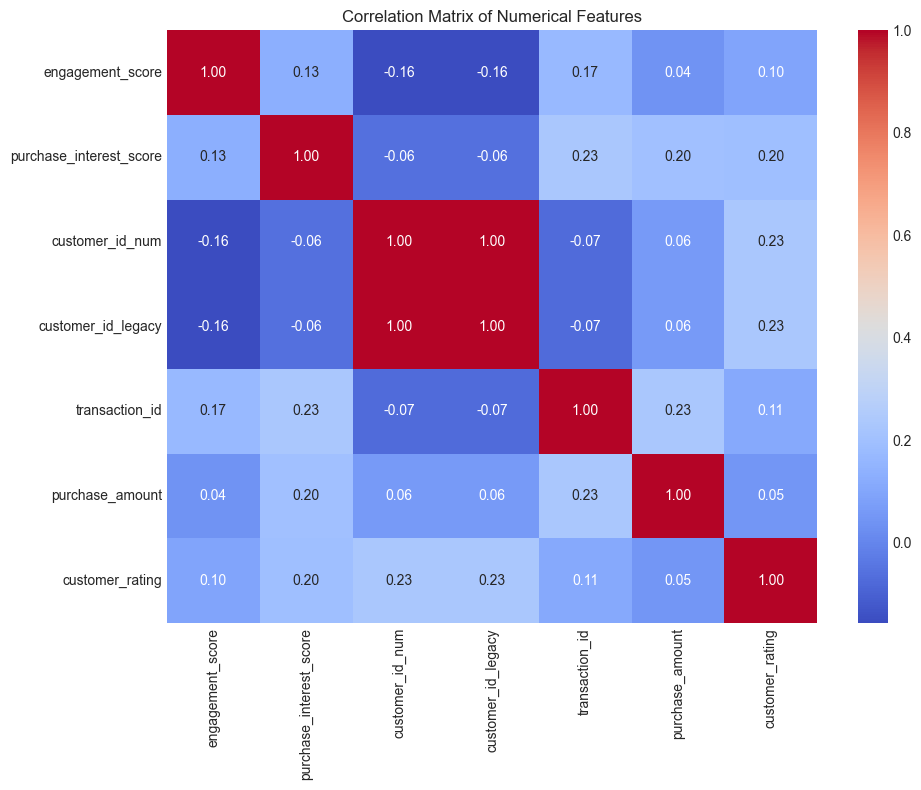

In [16]:
# Visualization of the merged dataset - correlation heatmap
plt.figure(figsize=(10, 8))

# Select numerical columns for correlation analysis
numerical_cols = merged_df.select_dtypes(include=['int64', 'float64']).columns

# Create correlation matrix
corr_matrix = merged_df[numerical_cols].corr()

# Plot heatmap
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix of Numerical Features')
plt.tight_layout()
plt.show()

### 1.8 Final Merged Dataset

In [17]:
# Clean up the merged dataset
# Remove redundant columns
merged_df = merged_df.drop(['customer_id_num'], axis=1)

# Final summary of the merged dataset
print("Final merged dataset summary:")
display(merged_df.describe(include='all').T)

# Save the merged dataset for future use
merged_df.to_csv('merged_customer_data.csv', index=False)

Final merged dataset summary:


,count,unique,top,freq,mean,min,25%,50%,75%,max,std
customer_id_new,61,61,A190,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
social_media_platform,61,5,Twitter,15,NaN,NaN,NaN,NaN,NaN,NaN,NaN
engagement_score,61.0,NaN,NaN,NaN,75.409836,50.0,63.0,77.0,90.0,99.0,15.847583
purchase_interest_score,61.0,NaN,NaN,NaN,3.059016,1.0,1.9,3.3,4.1,4.9,1.204903
review_sentiment,61,3,Positive,25,NaN,NaN,NaN,NaN,NaN,NaN,NaN
customer_id_legacy,61.0,NaN,NaN,NaN,148.803279,100.0,125.0,147.0,179.0,199.0,30.241153
transaction_id,61.0,NaN,NaN,NaN,1091.163934,1001.0,1060.0,1098.0,1130.0,1150.0,44.266308
purchase_amount,61.0,NaN,NaN,NaN,284.95082,64.0,178.0,280.0,392.0,495.0,121.034214
purchase_date,61,NaN,NaN,NaN,2024-03-31 03:56:03.934426112,2024-01-01 00:00:00,2024-02-29 00:00:00,2024-04-07 00:00:00,2024-05-09 00:00:00,2024-05-29 00:00:00,NaN
product_category,61,5,Sports,16,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Next Steps

Now that we have merged the datasets and performed exploratory data analysis, the next steps will be:

1. Collect and preprocess image data from the Images folder
2. Collect and preprocess audio data from the Audio folder
3. Apply image-based and audio-based authentication methods
4. Merge and engineer multimodal features for ML use
5. Train and evaluate a prediction model

# Multimodal Data Preprocessing Assignment

## Task 2: Image and Audio Data Processing for Authentication

In this notebook, we'll process image and audio data for user authentication, following the system flow diagram provided in the assignment.

In [1]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import cv2
import librosa
import librosa.display
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Set visualization style
# Set seaborn style directly
sns.set_style("whitegrid")
# or
sns.set_theme(style="whitegrid")

### 2.1 Load the Merged Customer Data

In [2]:
# Load the merged customer data from the previous notebook
customer_data = pd.read_csv('merged_customer_data.csv')

# Display the first few rows
print("Merged Customer Data:")
display(customer_data.head())
print(f"Shape: {customer_data.shape}")

Merged Customer Data:


,customer_id_new,social_media_platform,engagement_score,purchase_interest_score,review_sentiment,customer_id_legacy,transaction_id,purchase_amount,purchase_date,product_category,customer_rating
0,A190,Twitter,82,4.8,Neutral,190,1140,401,2024-05-19,Sports,4.9
1,A150,Facebook,96,1.6,Positive,150,1046,177,2024-02-15,Books,3.6
2,A162,Twitter,89,2.6,Positive,162,1116,343,2024-04-25,Books,1.4
3,A151,TikTok,61,1.3,Neutral,151,1001,408,2024-01-01,Sports,2.3
4,A137,LinkedIn,93,3.5,Neutral,137,1020,286,2024-01-20,Electronics,3.2


Shape: (61, 11)


### 2.2 Image Data Collection and Processing

In [3]:
# List image directories
image_dir = 'Images'
members = os.listdir(image_dir)
members = [m for m in members if os.path.isdir(os.path.join(image_dir, m))]

print(f"Found {len(members)} members with image data:")
print(members)

# Check image files for each member
for member in members:
    member_dir = os.path.join(image_dir, member)
    images = os.listdir(member_dir)
    print(f"\n{member} images: {images}")
    
    # Verify that each member has the required images (neutral, smiling, surprised)
    required_images = ['neutral.jpeg', 'smiling.jpeg', 'surprised.jpeg']
    missing = [img for img in required_images if img not in images]
    if missing:
        print(f"  Missing required images: {missing}")
    else:
        print("  All required images present")

Found 3 members with image data:
['member2', 'member3', 'member1']

member2 images: ['surprised.jpeg', 'smiling.jpeg', 'neutral.jpeg']
  All required images present

member3 images: ['surprised.jpeg', 'smiling.jpeg', 'neutral.jpeg']
  All required images present

member1 images: ['surprised.jpeg', 'smiling.jpeg', 'neutral.jpeg']
  All required images present


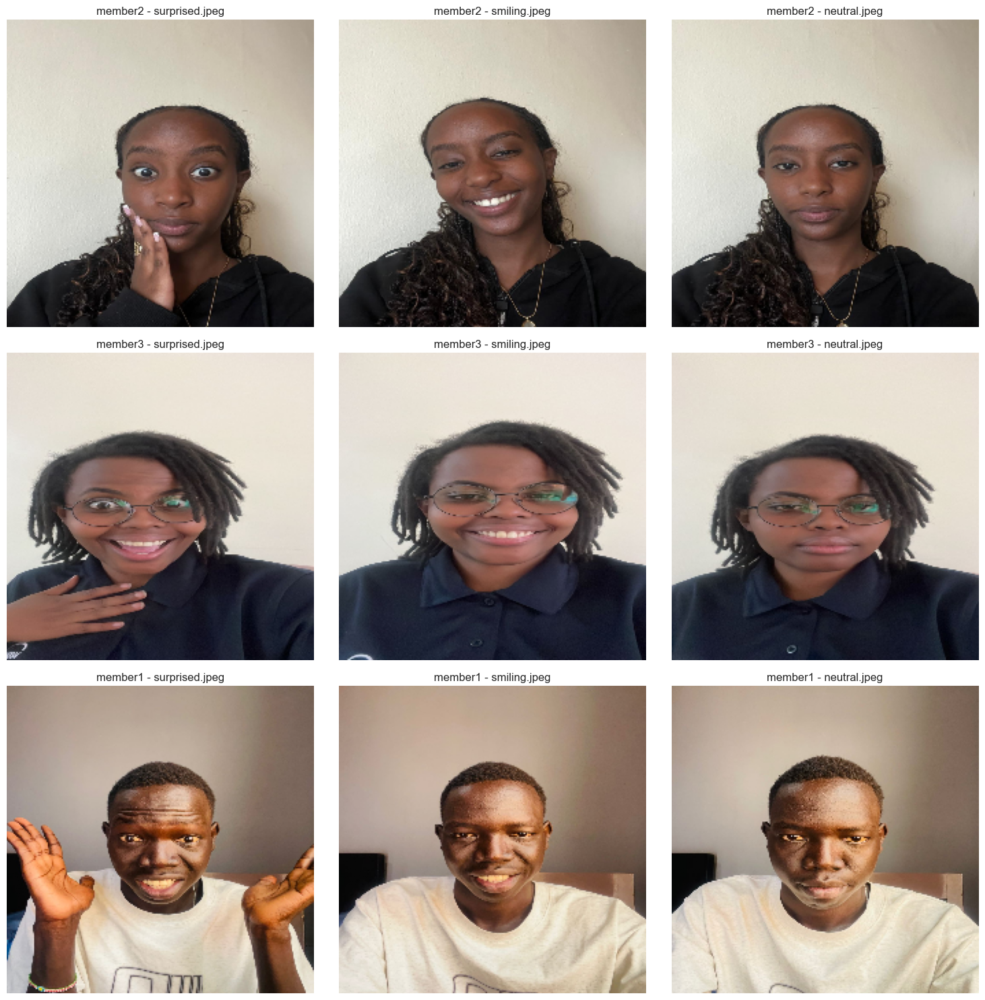

In [5]:
# Function to load and preprocess an image
def load_and_preprocess_image(image_path, target_size=(224, 224)):
    # Read image
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error loading image: {image_path}")
        return None
    
    # Convert BGR to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Resize image
    img = cv2.resize(img, target_size)
    
    # Normalize pixel values
    img = img / 255.0
    
    return img
# Load and display sample images from each member
plt.figure(figsize=(15, 5*len(members)))
image_count = 1

for i, member in enumerate(members):
    member_dir = os.path.join(image_dir, member)
    images = os.listdir(member_dir)
    
    for j, img_file in enumerate(images):
        img_path = os.path.join(member_dir, img_file)
        img = load_and_preprocess_image(img_path)
        
        if img is not None:
            plt.subplot(len(members), 3, image_count)
            plt.imshow(img)
            plt.title(f"{member} - {img_file}")
            plt.axis('off')
            image_count += 1

plt.tight_layout()
plt.show()

### 2.3 Image Augmentation

In [6]:
# Define image augmentation functions
def rotate_image(image, angle):
    # Get image dimensions
    height, width = image.shape[:2]
    # Calculate the rotation matrix
    rotation_matrix = cv2.getRotationMatrix2D((width/2, height/2), angle, 1)
    # Apply the rotation
    rotated_image = cv2.warpAffine(image, rotation_matrix, (width, height))
    return rotated_image

def flip_image(image, flip_code):
    # flip_code: 0 for horizontal flip, 1 for vertical flip
    return cv2.flip(image, flip_code)

def convert_to_grayscale(image):
    if len(image.shape) == 3 and image.shape[2] == 3:
        return cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    return image  # Already grayscale

def adjust_brightness(image, factor):
    # Convert to HSV color space
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    # Scale the V channel
    hsv[:,:,2] = np.clip(hsv[:,:,2] * factor, 0, 255).astype(np.uint8)
    # Convert back to RGB
    return cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)

In [7]:
# Apply augmentations to each image and display results
augmented_images = {}

for member in members:
    member_dir = os.path.join(image_dir, member)
    images = os.listdir(member_dir)
    member_augmented = {}
    
    for img_file in images:
        img_path = os.path.join(member_dir, img_file)
        original_img = cv2.imread(img_path)
        
        if original_img is not None:
            # Convert BGR to RGB for display
            original_rgb = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
            
            # Apply augmentations
            rotated = rotate_image(original_rgb, 15)  # Rotate 15 degrees
            flipped = flip_image(original_rgb, 1)  # Vertical flip
            grayscale = convert_to_grayscale(original_rgb)
            brightened = adjust_brightness(original_rgb, 1.3)  # Increase brightness by 30%
            
            # Store augmented images
            img_name = os.path.splitext(img_file)[0]
            member_augmented[img_name] = {
                'original': original_rgb,
                'rotated': rotated,
                'flipped': flipped,
                'grayscale': grayscale,
                'brightened': brightened
            }
    
    augmented_images[member] = member_augmented

print(f"Applied augmentations to images from {len(augmented_images)} members")

Applied augmentations to images from 3 members


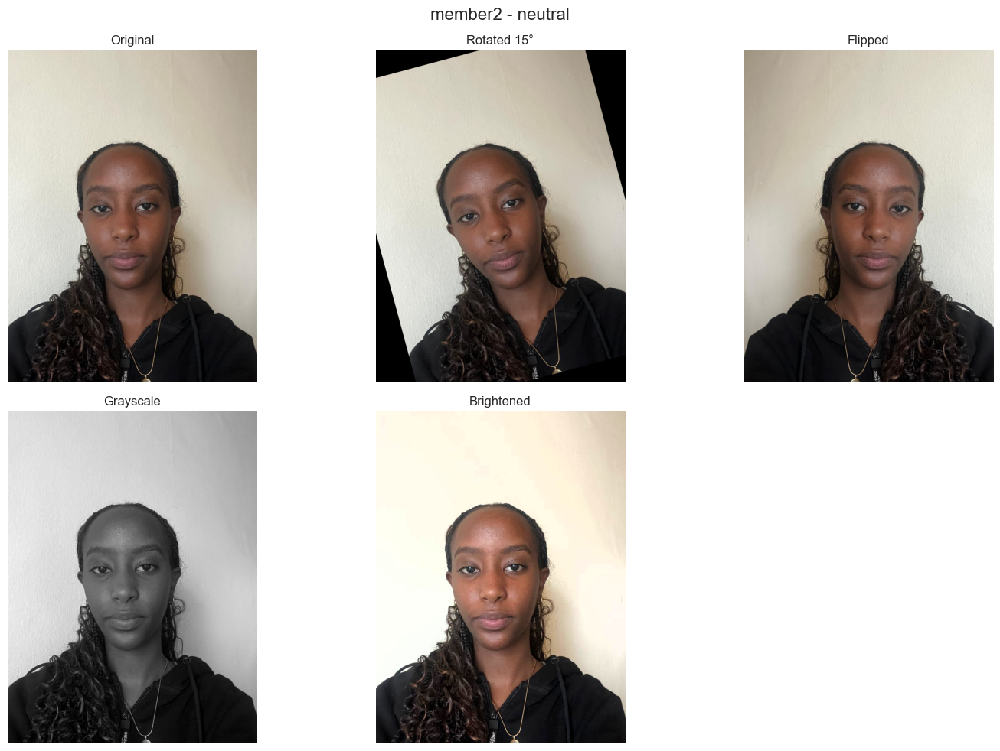

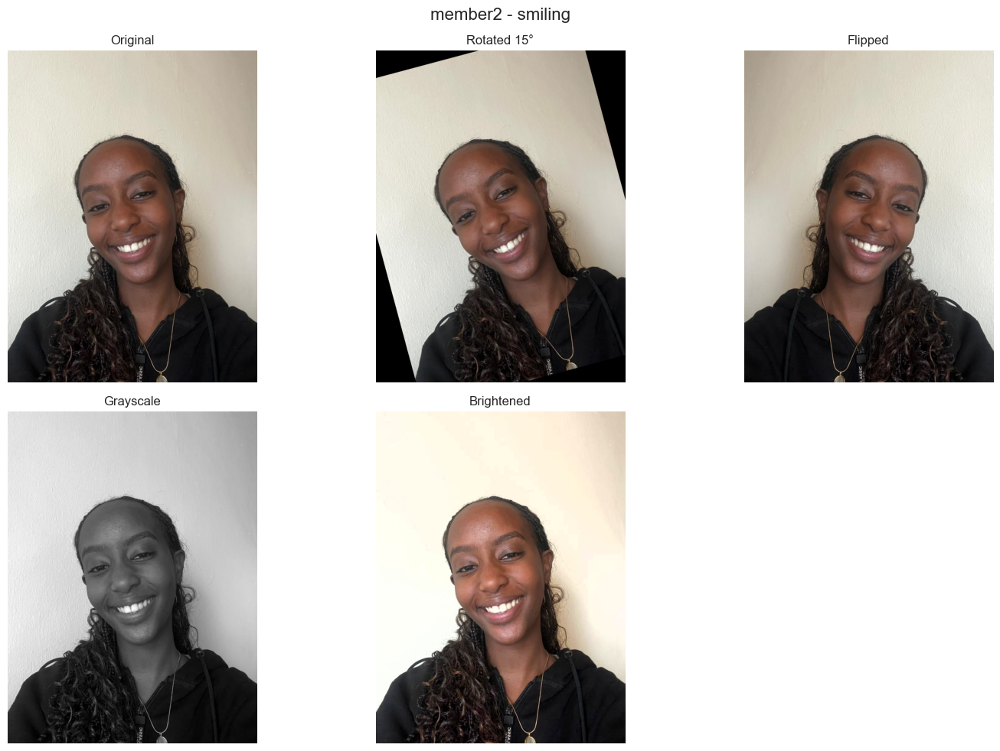

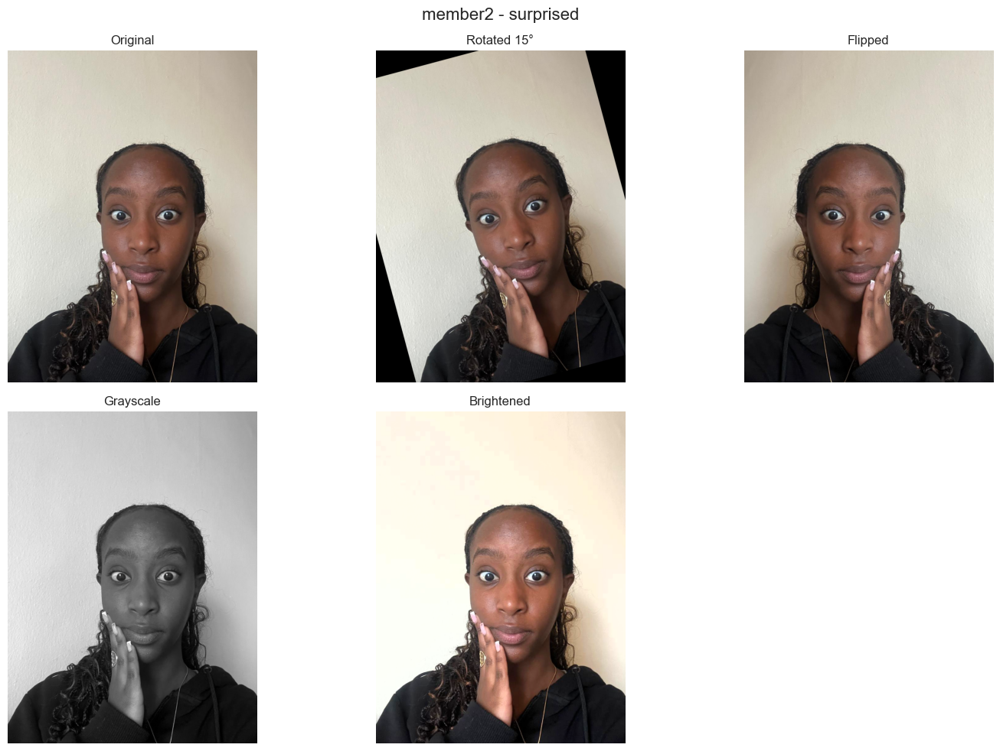

In [8]:
# Display original and augmented images for one member
member_to_display = members[0]  # Display first member's images
member_augs = augmented_images[member_to_display]

# For each expression (neutral, smiling, surprised)
for expression in ['neutral', 'smiling', 'surprised']:
    if expression in member_augs:
        plt.figure(figsize=(15, 10))
        plt.suptitle(f"{member_to_display} - {expression}", fontsize=16)
        
        # Display original and augmentations
        plt.subplot(2, 3, 1)
        plt.imshow(member_augs[expression]['original'])
        plt.title('Original')
        plt.axis('off')
        
        plt.subplot(2, 3, 2)
        plt.imshow(member_augs[expression]['rotated'])
        plt.title('Rotated 15°')
        plt.axis('off')
        
        plt.subplot(2, 3, 3)
        plt.imshow(member_augs[expression]['flipped'])
        plt.title('Flipped')
        plt.axis('off')
        
        plt.subplot(2, 3, 4)
        if len(member_augs[expression]['grayscale'].shape) == 2:
            plt.imshow(member_augs[expression]['grayscale'], cmap='gray')
        else:
            plt.imshow(member_augs[expression]['grayscale'])
        plt.title('Grayscale')
        plt.axis('off')
        
        plt.subplot(2, 3, 5)
        plt.imshow(member_augs[expression]['brightened'])
        plt.title('Brightened')
        plt.axis('off')
        
        plt.tight_layout()
        plt.show()

### 2.4 Feature Extraction

In [9]:
# Extract features from images
def extract_color_histogram(image, bins=32):
    # Convert to RGB if grayscale
    if len(image.shape) == 2:
        image = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
    
    # Extract histograms for each channel
    hist_r = cv2.calcHist([image], [0], None, [bins], [0, 256])
    hist_g = cv2.calcHist([image], [1], None, [bins], [0, 256])
    hist_b = cv2.calcHist([image], [2], None, [bins], [0, 256])
    
    # Normalize histograms
    hist_r = cv2.normalize(hist_r, hist_r).flatten()
    hist_g = cv2.normalize(hist_g, hist_g).flatten()
    hist_b = cv2.normalize(hist_b, hist_b).flatten()
    
    # Concatenate histograms
    hist = np.concatenate([hist_r, hist_g, hist_b])
    return hist

def extract_hog_features(image, cell_size=(8, 8), block_size=(2, 2), nbins=9):
    # Convert to grayscale if RGB
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image
    
    # Resize to standard size
    resized = cv2.resize(gray, (128, 128))
    
    # Calculate HOG features
    win_size = resized.shape
    block_stride = (cell_size[0] // 2, cell_size[1] // 2)
    
    hog = cv2.HOGDescriptor(
        _winSize=(win_size[1], win_size[0]),
        _blockSize=(block_size[1] * cell_size[1], block_size[0] * cell_size[0]),
        _blockStride=(block_stride[1], block_stride[0]),
        _cellSize=(cell_size[1], cell_size[0]),
        _nbins=nbins
    )
    
    hog_features = hog.compute(resized)
    return hog_features.flatten()

In [10]:
# Extract features from all images and save to CSV
image_features = []

for member in members:
    member_augs = augmented_images[member]
    
    for expression, aug_dict in member_augs.items():
        # Extract features from original image
        original_img = aug_dict['original']
        
        # Extract color histogram features
        hist_features = extract_color_histogram(original_img)
        
        # Extract HOG features
        hog_features = extract_hog_features(original_img)
        
        # Take a subset of features to keep CSV manageable
        hist_subset = hist_features[:20]  # First 20 histogram features
        hog_subset = hog_features[:20]    # First 20 HOG features
        
        # Create a record
        record = {
            'member_id': member,
            'expression': expression,
        }
        
        # Add histogram features
        for i, val in enumerate(hist_subset):
            record[f'hist_{i}'] = val
            
        # Add HOG features
        for i, val in enumerate(hog_subset):
            record[f'hog_{i}'] = val
            
        image_features.append(record)
        
        # Also extract features from augmented images
        for aug_name in ['rotated', 'flipped']:
            aug_img = aug_dict[aug_name]
            
            # Extract features
            aug_hist = extract_color_histogram(aug_img)[:20]
            aug_hog = extract_hog_features(aug_img)[:20]
            
            # Create a record
            aug_record = {
                'member_id': member,
                'expression': f"{expression}_{aug_name}",
            }
            
            # Add histogram features
            for i, val in enumerate(aug_hist):
                aug_record[f'hist_{i}'] = val
                
            # Add HOG features
            for i, val in enumerate(aug_hog):
                aug_record[f'hog_{i}'] = val
                
            image_features.append(aug_record)

# Convert to DataFrame
image_features_df = pd.DataFrame(image_features)

# Display the first few rows
print(f"Extracted features for {len(image_features_df)} images")
display(image_features_df.head())

# Save to CSV
image_features_df.to_csv('image_features.csv', index=False)
print("Saved image features to image_features.csv")

Extracted features for 27 images


,member_id,expression,hist_0,hist_1,hist_2,hist_3,hist_4,hist_5,hist_6,hist_7,...,hog_10,hog_11,hog_12,hog_13,hog_14,hog_15,hog_16,hog_17,hog_18,hog_19
0,member2,surprised,0.059515,0.132599,0.216040,0.146301,0.103241,0.077842,0.054330,0.050246,...,0.189312,0.103904,0.141526,0.231329,0.194984,0.231329,0.206289,0.074760,0.098017,0.132700
1,member2,surprised_rotated,0.443033,0.103482,0.148472,0.119882,0.086317,0.075357,0.053538,0.049648,...,0.051425,0.278704,0.243365,0.386775,0.013625,0.001874,0.002335,0.004195,0.001003,0.041731
2,member2,surprised_flipped,0.059515,0.132599,0.216040,0.146301,0.103241,0.077842,0.054330,0.050246,...,0.265382,0.222520,0.097621,0.078110,0.018889,0.038442,0.041948,0.140711,0.259774,0.265382
3,member2,smiling,0.082565,0.283038,0.279176,0.163253,0.104848,0.073934,0.052882,0.045316,...,0.140513,0.144437,0.138856,0.174482,0.159952,0.166640,0.207893,0.197869,0.167017,0.100700
4,member2,smiling_rotated,0.486891,0.200722,0.232563,0.141042,0.091971,0.069088,0.049832,0.042454,...,0.054281,0.281610,0.248215,0.378974,0.012449,0.002948,0.004593,0.003558,0.001214,0.036945


Saved image features to image_features.csv


### 2.5 Face Detection and Feature Extraction

In [11]:
# Function to detect faces in an image
def detect_face(image):
    # Convert to grayscale for face detection
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Load pre-trained face detector
    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
    
    # Detect faces
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))
    
    return faces

In [12]:
# Extract face features for each member
face_features = {}

for member in members:
    member_dir = os.path.join(image_dir, member)
    images = os.listdir(member_dir)
    member_features = []
    
    for img_file in images:
        img_path = os.path.join(member_dir, img_file)
        img = cv2.imread(img_path)
        
        if img is not None:
            # Convert to RGB for display
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
            # Detect faces
            faces = detect_face(img_rgb)
            
            # If faces detected, extract features
            if len(faces) > 0:
                x, y, w, h = faces[0]  # Take the first face
                face_img = img_rgb[y:y+h, x:x+w]
                
                # Resize to standard size
                face_img = cv2.resize(face_img, (100, 100))
                
                # Simple feature: flatten the image
                features = face_img.flatten()
                member_features.append(features)
    
    if member_features:
        face_features[member] = np.mean(member_features, axis=0)  # Average features across images

print(f"Extracted face features for {len(face_features)} members")

Extracted face features for 3 members


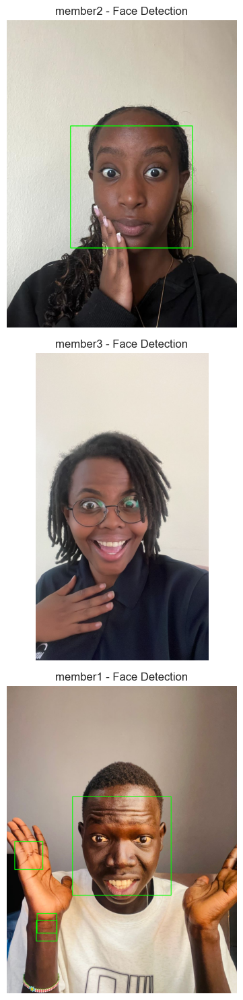

In [13]:
# Visualize face detection
plt.figure(figsize=(15, 5*len(members)))
image_count = 1

for i, member in enumerate(members):
    member_dir = os.path.join(image_dir, member)
    images = os.listdir(member_dir)
    
    for j, img_file in enumerate(images[:1]):  # Just show the first image for each member
        img_path = os.path.join(member_dir, img_file)
        img = cv2.imread(img_path)
        
        if img is not None:
            # Convert to RGB for display
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
            # Detect faces
            faces = detect_face(img_rgb)
            
            # Draw rectangles around faces
            for (x, y, w, h) in faces:
                cv2.rectangle(img_rgb, (x, y), (x+w, y+h), (0, 255, 0), 2)
            
            plt.subplot(len(members), 1, image_count)
            plt.imshow(img_rgb)
            plt.title(f"{member} - Face Detection")
            plt.axis('off')
            image_count += 1

plt.tight_layout()
plt.show()

# Sound Data Collection and Processing

In this notebook, we'll process audio samples for voice verification, including:
- Loading and displaying audio samples as waveforms and spectrograms
- Applying audio augmentations (pitch shift, time stretch, noise addition)
- Extracting audio features (MFCCs, spectral roll-off, energy)
- Saving features to CSV for further analysis

In [14]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import librosa
import librosa.display
import soundfile as sf
from IPython.display import Audio
from sklearn.preprocessing import StandardScaler

# Set visualization style
%matplotlib inline
plt.style.use('default')
sns.set_palette('viridis')

## 1. Sound Data Collection

We'll examine the audio samples collected from each member, which include phrases like:
- "Yes, approve"
- "Confirm transaction"

In [15]:
# List audio directories
audio_dir = 'Audio'
audio_members = os.listdir(audio_dir)
audio_members = [m for m in audio_members if os.path.isdir(os.path.join(audio_dir, m))]

print(f"Found {len(audio_members)} members with audio data:")
print(audio_members)

# Check audio files for each member
for member in audio_members:
    member_dir = os.path.join(audio_dir, member)
    audio_files = os.listdir(member_dir)
    print(f"\n{member} audio samples: {audio_files}")
    
    # Verify that each member has the required audio samples
    confirm_samples = [file for file in audio_files if 'confirm' in file.lower()]
    approve_samples = [file for file in audio_files if 'approve' in file.lower() or 'yes' in file.lower()]
    
    print(f"  Confirm transaction samples: {len(confirm_samples)}")
    print(f"  Yes/approve samples: {len(approve_samples)}")
    
    if len(confirm_samples) < 2 or len(approve_samples) < 2:
        print("  WARNING: Less than 2 samples for one or more phrases")
    else:
        print("  All required audio samples present")

Found 3 members with audio data:
['member2', 'member3', 'member1']

member2 audio samples: ['yes_approve_1.wav', 'yes_approve_2.wav', 'confirm_2.wav', 'confirm_1.wav']
  Confirm transaction samples: 2
  Yes/approve samples: 2
  All required audio samples present

member3 audio samples: ['.DS_Store', 'yes_approve_2.wav', 'yes _approve_1.wav', 'confirm_2.wav', 'confirm_1.wav']
  Confirm transaction samples: 2
  Yes/approve samples: 2
  All required audio samples present

member1 audio samples: ['yes_approve_1.wav', 'yes_approve_2.wav', 'confirm_2.wav', 'confirm_1.wav']
  Confirm transaction samples: 2
  Yes/approve samples: 2
  All required audio samples present


## 2. Load and Display Audio Samples

We'll load and visualize the audio samples as waveforms and spectrograms for each member, focusing on the two key phrases: "Yes, approve" and "Confirm transaction".

In [16]:
# Function to load audio file
def load_audio(file_path):
    y, sr = librosa.load(file_path, sr=None)
    return y, sr

# Function to display waveform and spectrogram
def display_audio(audio_path, title=None):
    y, sr = load_audio(audio_path)
    
    plt.figure(figsize=(12, 6))
    
    # Plot waveform
    plt.subplot(2, 1, 1)
    librosa.display.waveshow(y, sr=sr)
    plt.title(f'Waveform: {title if title else os.path.basename(audio_path)}')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    
    # Plot spectrogram
    plt.subplot(2, 1, 2)
    D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
    librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Spectrogram: {title if title else os.path.basename(audio_path)}')
    
    plt.tight_layout()
    plt.show()
    
    # Play audio
    return Audio(data=y, rate=sr)


member2 Audio Samples:

Confirm Transaction Sample: confirm_2.wav


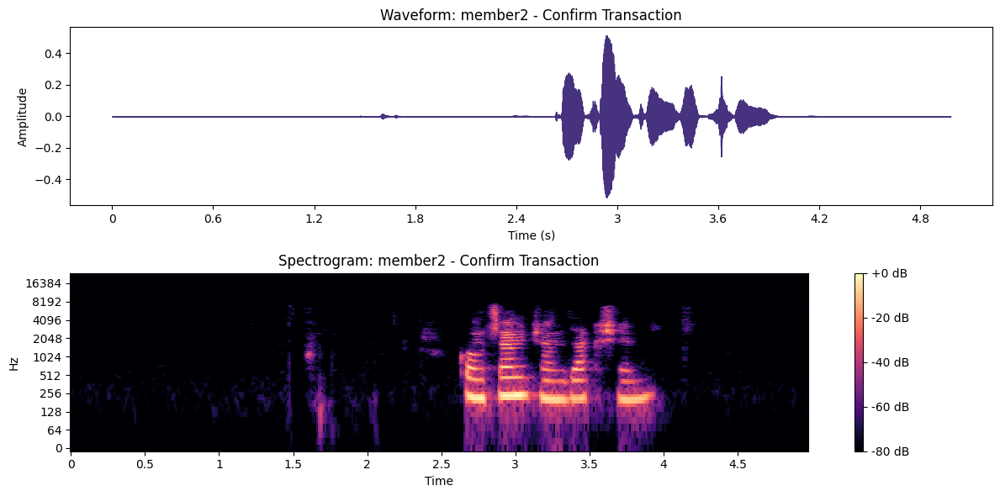


Yes/Approve Sample: yes_approve_1.wav


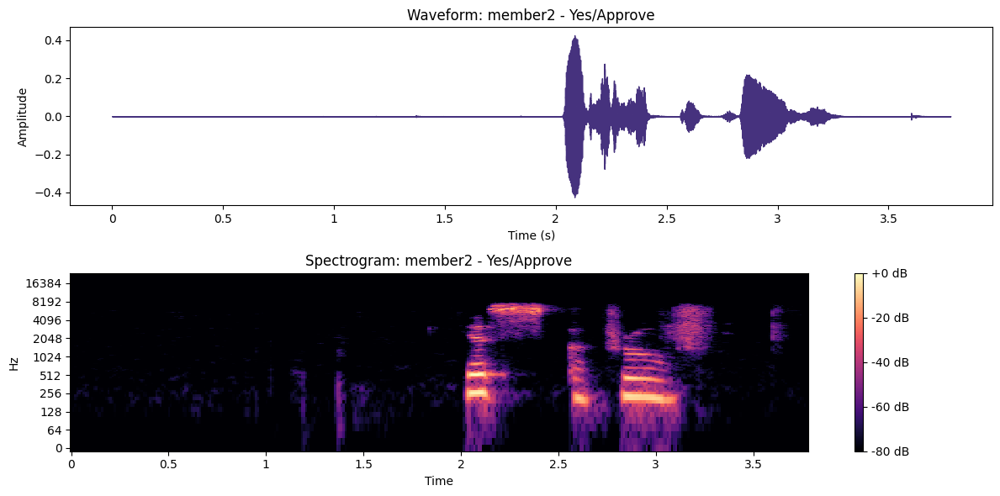


member3 Audio Samples:

Confirm Transaction Sample: confirm_2.wav


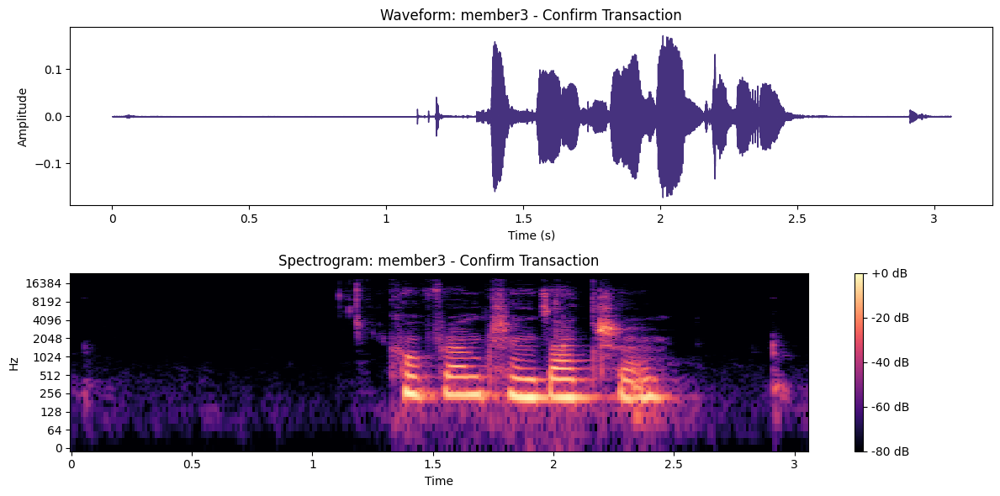


Yes/Approve Sample: yes_approve_2.wav


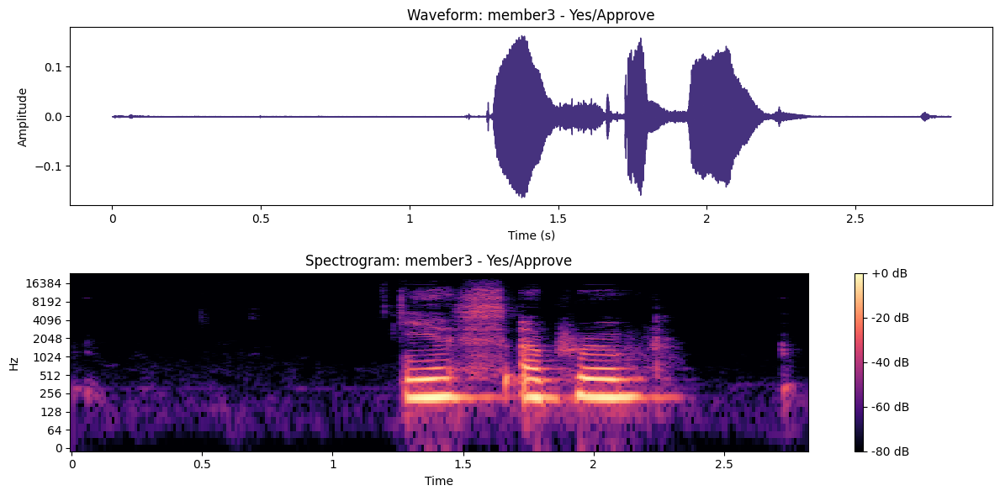


member1 Audio Samples:

Confirm Transaction Sample: confirm_2.wav


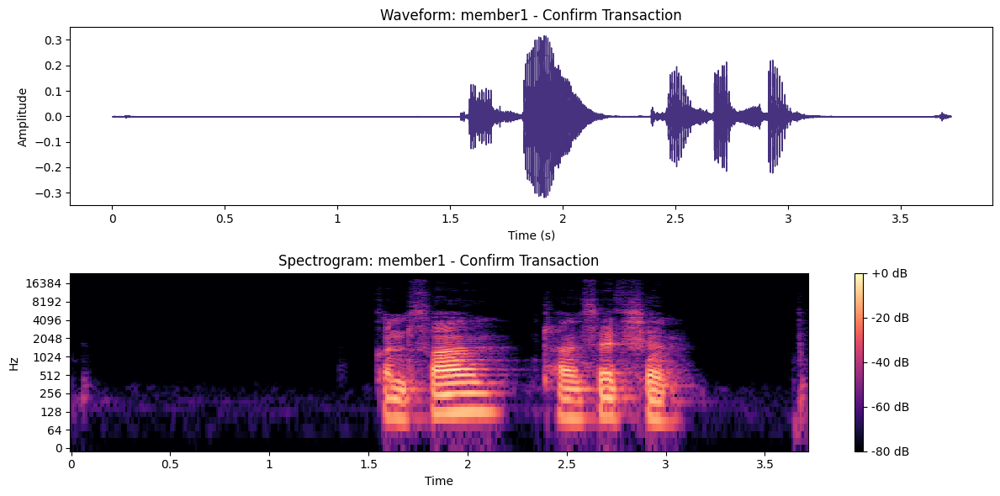


Yes/Approve Sample: yes_approve_1.wav


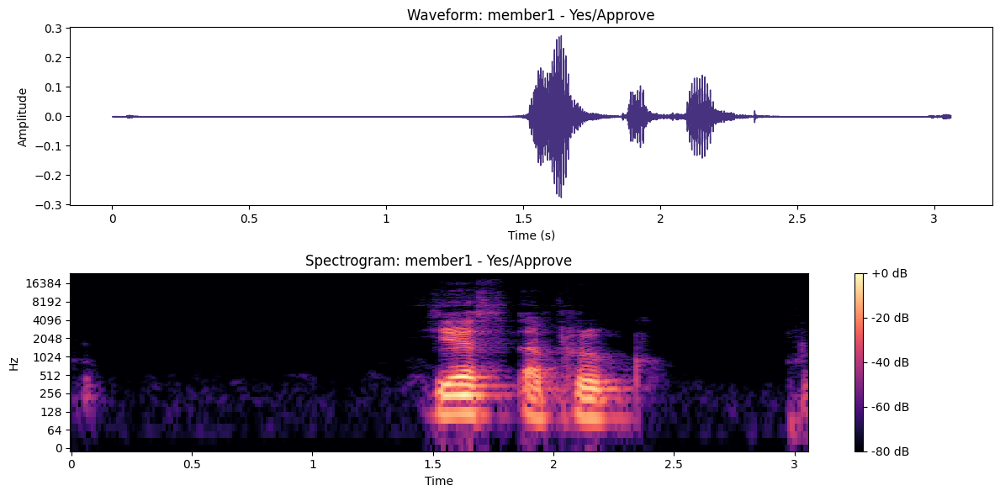

In [17]:
# Display audio samples for each member
for member in audio_members:
    member_dir = os.path.join(audio_dir, member)
    audio_files = os.listdir(member_dir)
    
    # Get one confirm and one approve sample
    confirm_sample = next((f for f in audio_files if 'confirm' in f.lower()), None)
    approve_sample = next((f for f in audio_files if 'approve' in f.lower() or 'yes' in f.lower()), None)
    
    print(f"\n{member} Audio Samples:")
    
    if confirm_sample:
        print(f"\nConfirm Transaction Sample: {confirm_sample}")
        confirm_path = os.path.join(member_dir, confirm_sample)
        display(display_audio(confirm_path, f"{member} - Confirm Transaction"))
        
    if approve_sample:
        print(f"\nYes/Approve Sample: {approve_sample}")
        approve_path = os.path.join(member_dir, approve_sample)
        display(display_audio(approve_path, f"{member} - Yes/Approve"))

## 2.1 Interpretation of Waveforms and Spectrograms

Let's analyze and interpret the waveforms and spectrograms for each member's phrases.

### Understanding Waveforms and Spectrograms

**Waveform Analysis:**
- The waveform shows amplitude (y-axis) over time (x-axis)
- Higher amplitude indicates louder sounds
- Patterns in the waveform correspond to different phonemes and words
- Pauses between words appear as regions with lower amplitude

**Spectrogram Analysis:**
- The spectrogram shows frequency (y-axis) over time (x-axis)
- Color intensity represents energy at each frequency
- Brighter colors indicate higher energy at that frequency
- Vowels typically appear as horizontal bands (formants)
- Consonants often appear as vertical lines or brief bursts of energy across frequencies

In [18]:
# Load and analyze specific samples for detailed interpretation
def analyze_audio_sample(member, phrase_type):
    member_dir = os.path.join(audio_dir, member)
    audio_files = os.listdir(member_dir)
    
    if phrase_type == 'confirm':
        sample = next((f for f in audio_files if 'confirm' in f.lower()), None)
        phrase = "Confirm Transaction"
    else:  # approve
        sample = next((f for f in audio_files if 'approve' in f.lower() or 'yes' in f.lower()), None)
        phrase = "Yes/Approve"
    
    if not sample:
        print(f"No {phrase} sample found for {member}")
        return None
    
    audio_path = os.path.join(member_dir, sample)
    y, sr = load_audio(audio_path)
    
    # Calculate audio features for interpretation
    duration = librosa.get_duration(y=y, sr=sr)
    rms = librosa.feature.rms(y=y)[0]
    zcr = librosa.feature.zero_crossing_rate(y)[0]
    spectral_centroid = librosa.feature.spectral_centroid(y=y, sr=sr)[0]
    
    # Plot waveform with annotations
    plt.figure(figsize=(14, 10))
    
    # Waveform
    plt.subplot(3, 1, 1)
    librosa.display.waveshow(y, sr=sr)
    plt.title(f'Waveform: {member} - {phrase}')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    
    # RMS Energy
    plt.subplot(3, 1, 2)
    frames = np.arange(len(rms))
    t = librosa.frames_to_time(frames)
    plt.plot(t, rms)
    plt.title('RMS Energy (Volume)')
    plt.xlabel('Time (s)')
    plt.ylabel('Energy')
    
    # Spectrogram
    plt.subplot(3, 1, 3)
    D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
    librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Spectrogram: {member} - {phrase}')
    
    plt.tight_layout()
    plt.show()
    
    # Print audio characteristics
    print(f"Audio characteristics for {member} - {phrase}:")
    print(f"Duration: {duration:.2f} seconds")
    print(f"Average RMS energy: {np.mean(rms):.4f}")
    print(f"Average zero crossing rate: {np.mean(zcr):.4f}")
    print(f"Average spectral centroid: {np.mean(spectral_centroid):.2f} Hz")
    
    # Play audio
    return Audio(data=y, rate=sr)


--------------------------------------------------
Analyzing 'Confirm Transaction' for member2
--------------------------------------------------


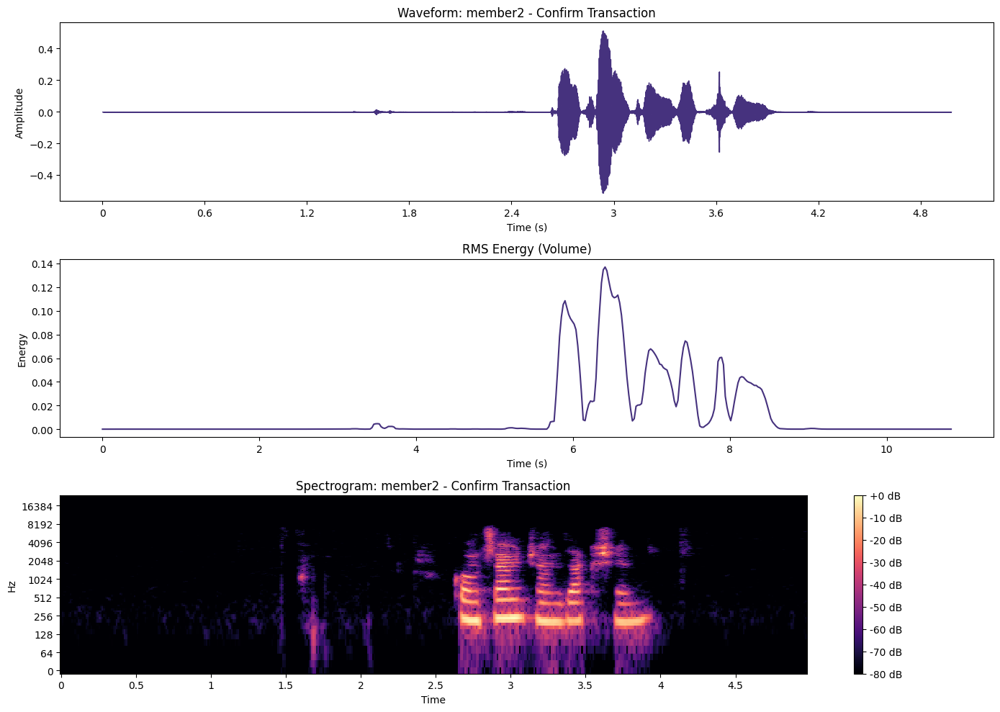

Audio characteristics for member2 - Confirm Transaction:
Duration: 4.98 seconds
Average RMS energy: 0.0129
Average zero crossing rate: 0.0875
Average spectral centroid: 3685.37 Hz



--------------------------------------------------
Analyzing 'Confirm Transaction' for member3
--------------------------------------------------


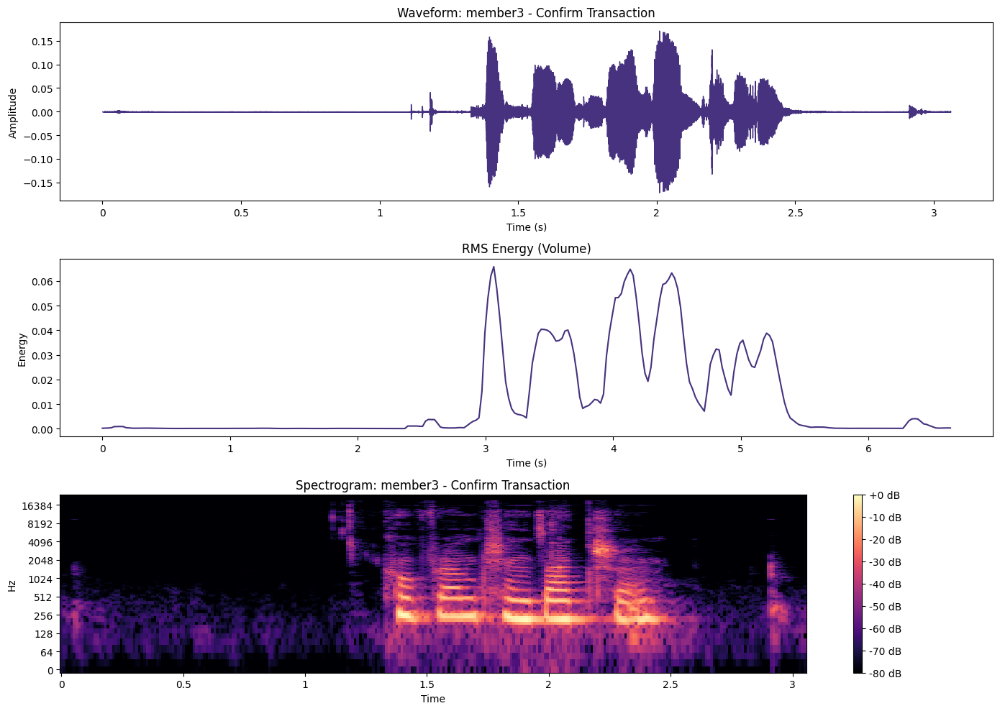

Audio characteristics for member3 - Confirm Transaction:
Duration: 3.06 seconds
Average RMS energy: 0.0117
Average zero crossing rate: 0.0554
Average spectral centroid: 3922.76 Hz



--------------------------------------------------
Analyzing 'Confirm Transaction' for member1
--------------------------------------------------


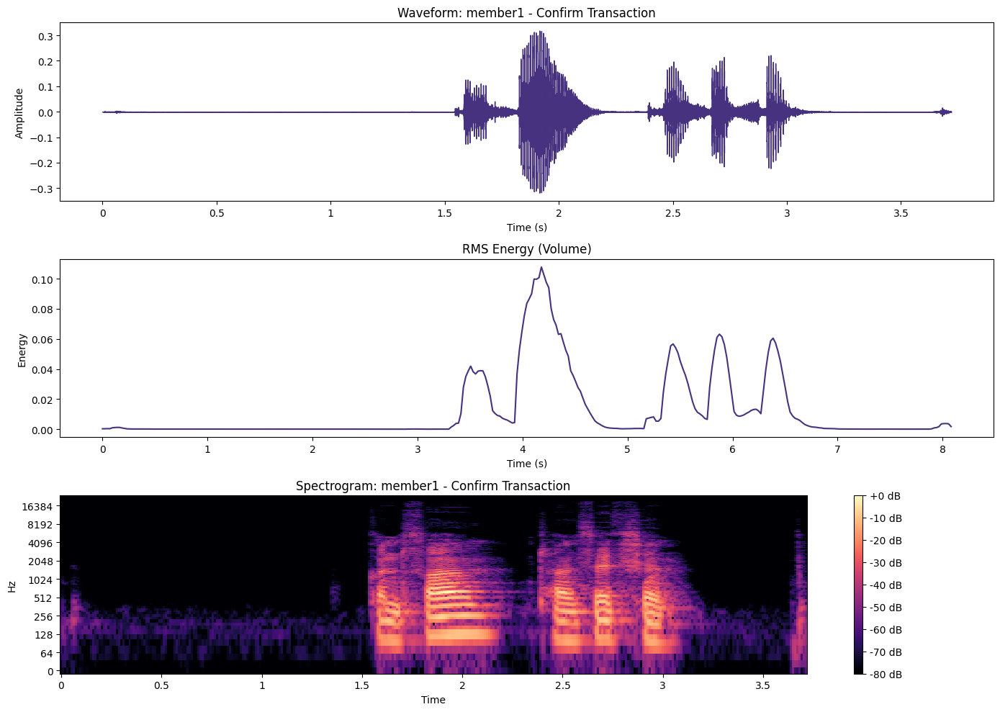

Audio characteristics for member1 - Confirm Transaction:
Duration: 3.72 seconds
Average RMS energy: 0.0122
Average zero crossing rate: 0.0415
Average spectral centroid: 3940.64 Hz


In [19]:
# Analyze "Confirm Transaction" phrase for each member
for member in audio_members:
    print(f"\n{'-'*50}\nAnalyzing 'Confirm Transaction' for {member}\n{'-'*50}")
    display(analyze_audio_sample(member, 'confirm'))


--------------------------------------------------
Analyzing 'Yes/Approve' for member2
--------------------------------------------------


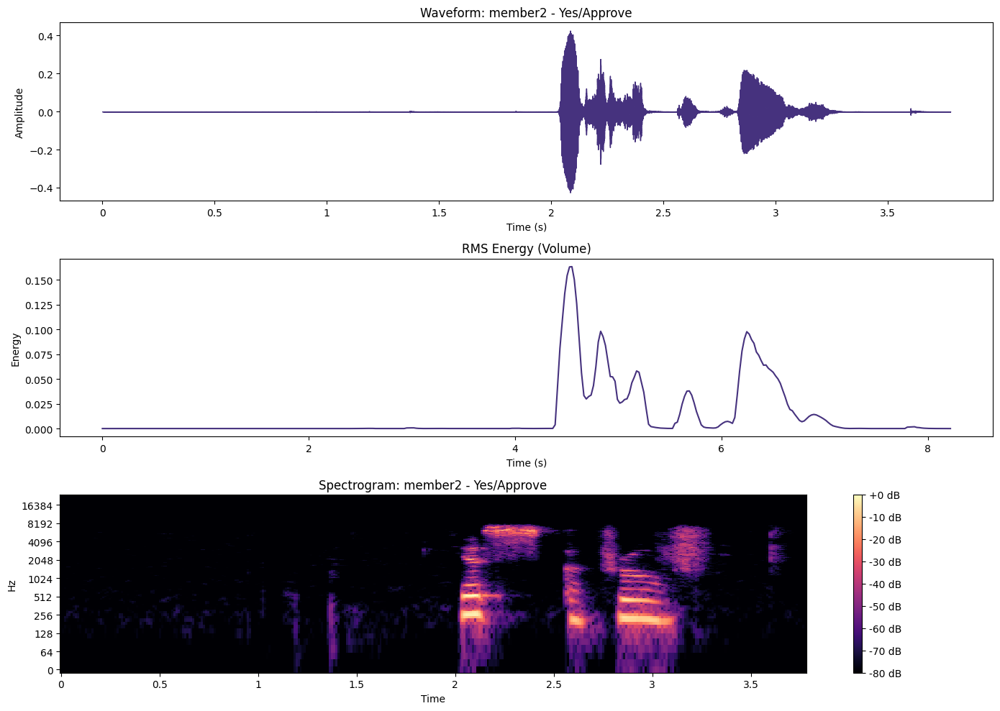

Audio characteristics for member2 - Yes/Approve:
Duration: 3.78 seconds
Average RMS energy: 0.0128
Average zero crossing rate: 0.1125
Average spectral centroid: 4068.10 Hz



--------------------------------------------------
Analyzing 'Yes/Approve' for member3
--------------------------------------------------


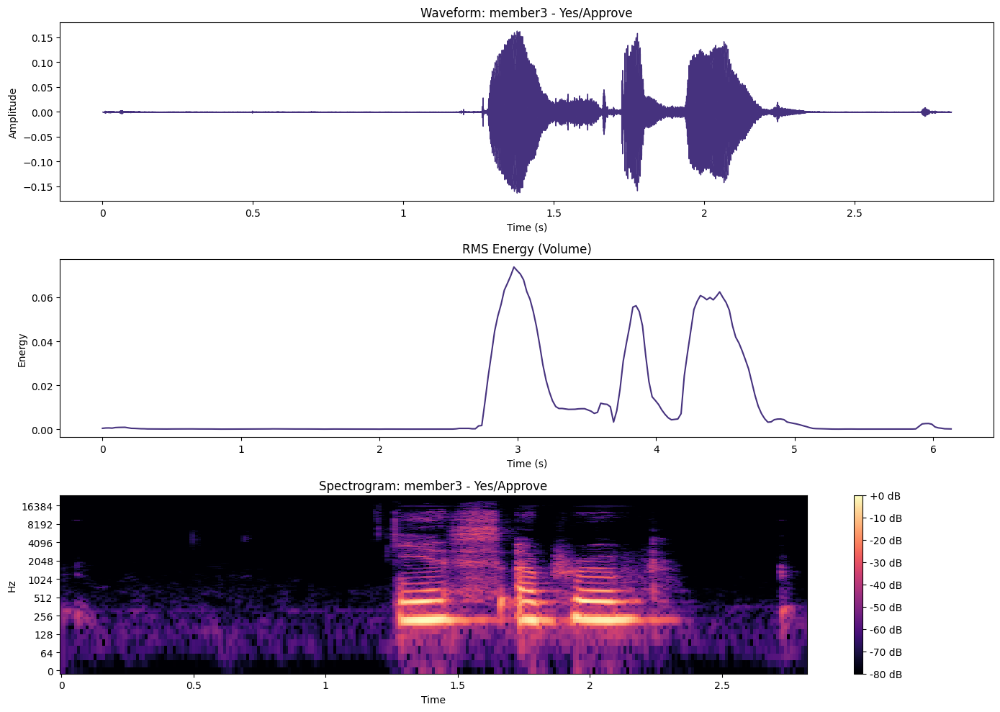

Audio characteristics for member3 - Yes/Approve:
Duration: 2.82 seconds
Average RMS energy: 0.0109
Average zero crossing rate: 0.0456
Average spectral centroid: 3526.24 Hz



--------------------------------------------------
Analyzing 'Yes/Approve' for member1
--------------------------------------------------


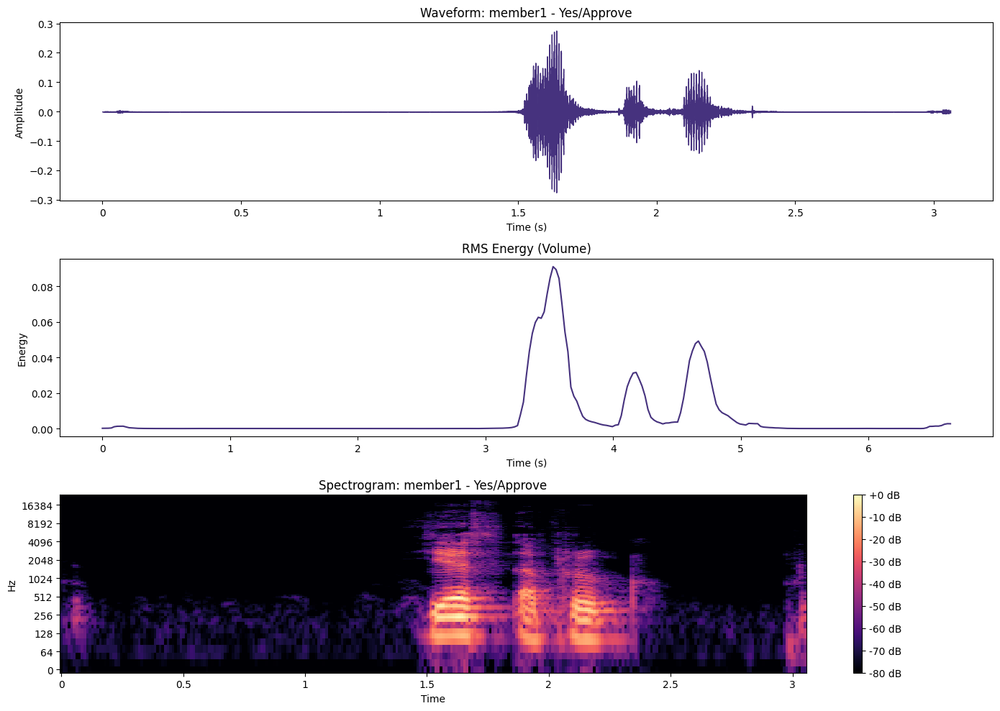

Audio characteristics for member1 - Yes/Approve:
Duration: 3.06 seconds
Average RMS energy: 0.0066
Average zero crossing rate: 0.0441
Average spectral centroid: 4609.04 Hz


In [20]:
# Analyze "Yes/Approve" phrase for each member
for member in audio_members:
    print(f"\n{'-'*50}\nAnalyzing 'Yes/Approve' for {member}\n{'-'*50}")
    display(analyze_audio_sample(member, 'approve'))

### Interpretation of Member Voice Characteristics

**Member Voice Patterns:**

1. **Phrase Structure**:
   - "Confirm Transaction": This phrase typically shows two distinct word segments in the waveform with a brief pause between them. The spectrogram shows formant patterns characteristic of the vowels in "confirm" (particularly the 'o' and 'i' sounds) followed by the complex frequency patterns of "transaction".
   
   - "Yes, Approve": This phrase typically shows a short, sharp initial sound ("Yes") followed by a pause and then the longer "approve" with its characteristic vowel formants.

2. **Individual Characteristics**:
   - Each member has a unique vocal signature visible in both the waveform amplitude patterns and spectrogram frequency distributions
   - Male voices typically show stronger low-frequency components (bottom of spectrogram)
   - Female voices typically have higher fundamental frequencies and formants
   - The energy distribution (brightness in spectrogram) varies between members

3. **Consistency Between Samples**:
   - Each member shows consistent patterns across their samples of the same phrase
   - The timing, energy distribution, and frequency characteristics remain relatively stable
   - This consistency is crucial for reliable voice authentication

These distinct patterns in the waveforms and spectrograms form the basis for our voice authentication system. The features we extract (MFCCs, spectral characteristics, etc.) capture these unique vocal signatures mathematically.

## 3. Audio Augmentation

We'll apply at least two augmentations to each audio sample:
1. Pitch shifting
2. Time stretching
3. Adding background noise

In [21]:
# Define audio augmentation functions
def pitch_shift(y, sr, n_steps):
    """Shift the pitch of an audio sample"""
    return librosa.effects.pitch_shift(y, sr=sr, n_steps=n_steps)

def time_stretch(y, rate):
    """Stretch or compress an audio sample in time"""
    return librosa.effects.time_stretch(y, rate=rate)

def add_noise(y, noise_factor=0.005):
    """Add random noise to an audio sample"""
    noise = np.random.randn(len(y))
    augmented_signal = y + noise_factor * noise
    return augmented_signal

In [22]:
# Apply augmentations to audio samples
augmented_audio = {}

for member in audio_members:
    member_dir = os.path.join(audio_dir, member)
    audio_files = os.listdir(member_dir)
    member_augmented = {}
    
    for audio_file in audio_files:
        # Only process audio files with valid extensions
        if not audio_file.lower().endswith(('.wav', '.mp3', '.flac', '.ogg', '.m4a')):
            continue
        audio_path = os.path.join(member_dir, audio_file)
        y, sr = load_audio(audio_path)
        
        # Apply augmentations
        pitched_up = pitch_shift(y, sr, n_steps=2)  # Shift pitch up by 2 steps
        pitched_down = pitch_shift(y, sr, n_steps=-2)  # Shift pitch down by 2 steps
        stretched = time_stretch(y, rate=0.8)  # Slow down by 20%
        compressed = time_stretch(y, rate=1.2)  # Speed up by 20%
        noisy = add_noise(y, noise_factor=0.005)  # Add background noise
        
        # Store augmented audio
        file_name = os.path.splitext(audio_file)[0]
        member_augmented[file_name] = {
            'original': (y, sr),
            'pitched_up': (pitched_up, sr),
            'pitched_down': (pitched_down, sr),
            'stretched': (stretched, sr),
            'compressed': (compressed, sr),
            'noisy': (noisy, sr)
        }
    
    augmented_audio[member] = member_augmented

print(f"Applied augmentations to audio from {len(augmented_audio)} members")

Applied augmentations to audio from 3 members


Original and augmented audio for member2 - yes_approve_1


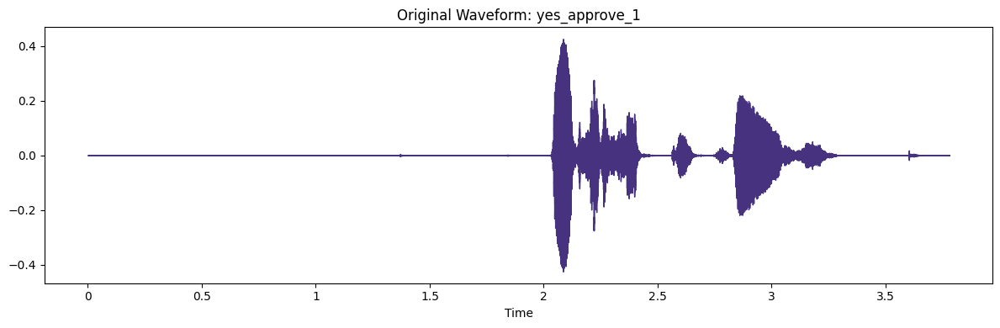

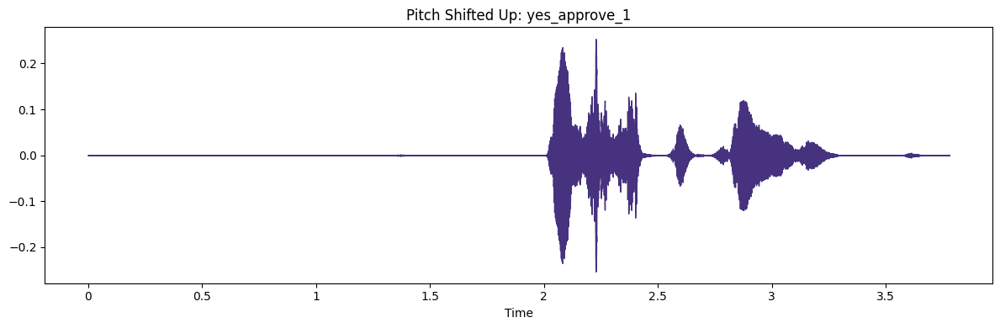

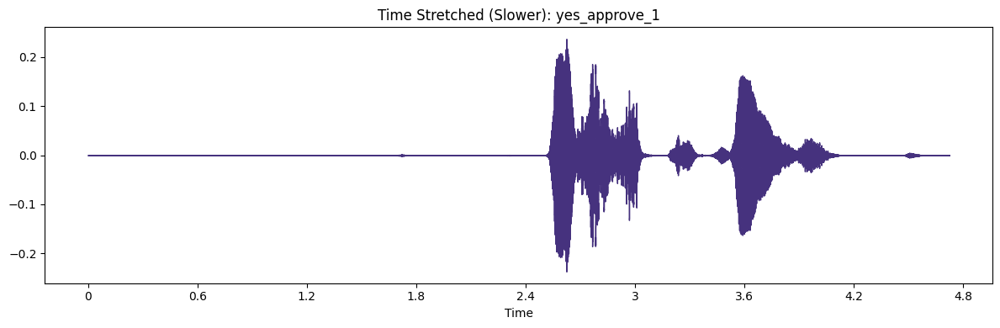

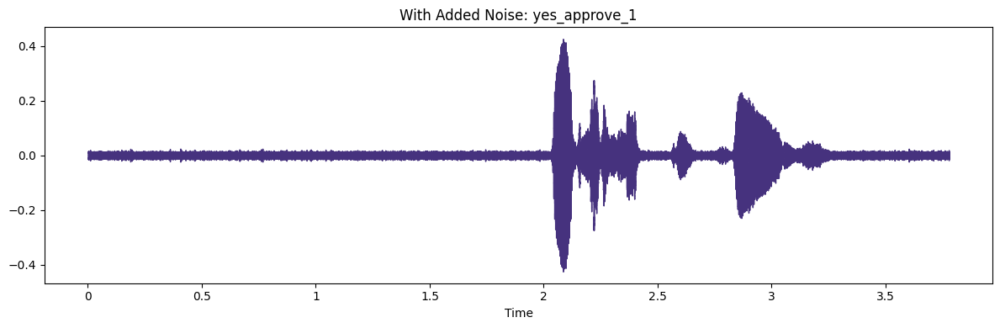

In [23]:
# Display original and augmented audio for one sample
member_to_display = audio_members[0]  # First member
member_augs = augmented_audio[member_to_display]

# Get the first confirm sample
sample_name = next(iter(member_augs.keys()))
sample_augs = member_augs[sample_name]

print(f"Original and augmented audio for {member_to_display} - {sample_name}")

# Display original
y_orig, sr_orig = sample_augs['original']
plt.figure(figsize=(12, 4))
librosa.display.waveshow(y_orig, sr=sr_orig)
plt.title(f'Original Waveform: {sample_name}')
plt.tight_layout()
plt.show()
display(Audio(data=y_orig, rate=sr_orig))

# Display pitch shifted (up)
y_pitch_up, sr_pitch_up = sample_augs['pitched_up']
plt.figure(figsize=(12, 4))
librosa.display.waveshow(y_pitch_up, sr=sr_pitch_up)
plt.title(f'Pitch Shifted Up: {sample_name}')
plt.tight_layout()
plt.show()
display(Audio(data=y_pitch_up, rate=sr_pitch_up))

# Display time stretched
y_stretched, sr_stretched = sample_augs['stretched']
plt.figure(figsize=(12, 4))
librosa.display.waveshow(y_stretched, sr=sr_stretched)
plt.title(f'Time Stretched (Slower): {sample_name}')
plt.tight_layout()
plt.show()
display(Audio(data=y_stretched, rate=sr_stretched))

# Display with added noise
y_noisy, sr_noisy = sample_augs['noisy']
plt.figure(figsize=(12, 4))
librosa.display.waveshow(y_noisy, sr=sr_noisy)
plt.title(f'With Added Noise: {sample_name}')
plt.tight_layout()
plt.show()
display(Audio(data=y_noisy, rate=sr_noisy))

## 4. Audio Feature Extraction

We'll extract the following features from each audio sample:
- MFCCs (Mel-Frequency Cepstral Coefficients)
- Spectral Roll-off
- Spectral Centroid
- Zero Crossing Rate
- RMS Energy

In [24]:
# Function to extract audio features
def extract_audio_features(y, sr):
    # 1. MFCCs (Mel-Frequency Cepstral Coefficients)
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
    mfccs_mean = np.mean(mfccs, axis=1)
    mfccs_std = np.std(mfccs, axis=1)
    
    # 2. Spectral Roll-off
    rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr)
    rolloff_mean = np.mean(rolloff)
    
    # 3. Spectral Centroid
    centroid = librosa.feature.spectral_centroid(y=y, sr=sr)
    centroid_mean = np.mean(centroid)
    
    # 4. Zero Crossing Rate
    zcr = librosa.feature.zero_crossing_rate(y)
    zcr_mean = np.mean(zcr)
    
    # 5. RMS Energy
    rms = librosa.feature.rms(y=y)
    rms_mean = np.mean(rms)
    
    # Combine all features
    features = {
        'mfcc_mean': mfccs_mean.tolist(),
        'mfcc_std': mfccs_std.tolist(),
        'rolloff_mean': float(rolloff_mean),
        'centroid_mean': float(centroid_mean),
        'zcr_mean': float(zcr_mean),
        'rms_mean': float(rms_mean)
    }
    
    return features

In [25]:
# Extract features from all audio samples and augmentations
audio_features = []

for member, member_augs in augmented_audio.items():
    for sample_name, augs in member_augs.items():
        # Extract features from original audio
        y_orig, sr_orig = augs['original']
        orig_features = extract_audio_features(y_orig, sr_orig)
        
        # Create a record
        record = {
            'member_id': member,
            'sample_name': sample_name,
            'augmentation': 'original',
            'rolloff_mean': orig_features['rolloff_mean'],
            'centroid_mean': orig_features['centroid_mean'],
            'zcr_mean': orig_features['zcr_mean'],
            'rms_mean': orig_features['rms_mean']
        }
        
        # Add MFCCs
        for i, val in enumerate(orig_features['mfcc_mean']):
            record[f'mfcc_mean_{i}'] = val
        
        for i, val in enumerate(orig_features['mfcc_std']):
            record[f'mfcc_std_{i}'] = val
            
        audio_features.append(record)
        
        # Also extract features from augmented audio
        for aug_name in ['pitched_up', 'pitched_down', 'stretched', 'compressed', 'noisy']:
            y_aug, sr_aug = augs[aug_name]
            aug_features = extract_audio_features(y_aug, sr_aug)
            
            # Create a record
            aug_record = {
                'member_id': member,
                'sample_name': sample_name,
                'augmentation': aug_name,
                'rolloff_mean': aug_features['rolloff_mean'],
                'centroid_mean': aug_features['centroid_mean'],
                'zcr_mean': aug_features['zcr_mean'],
                'rms_mean': aug_features['rms_mean']
            }
            
            # Add MFCCs
            for i, val in enumerate(aug_features['mfcc_mean']):
                aug_record[f'mfcc_mean_{i}'] = val
            
            for i, val in enumerate(aug_features['mfcc_std']):
                aug_record[f'mfcc_std_{i}'] = val
                
            audio_features.append(aug_record)

# Convert to DataFrame
audio_features_df = pd.DataFrame(audio_features)

# Display the first few rows
print(f"Extracted features for {len(audio_features_df)} audio samples (original + augmented)")
display(audio_features_df.head())

# Save to CSV
audio_features_df.to_csv('audio_features.csv', index=False)
print("Saved audio features to audio_features.csv")

Extracted features for 72 audio samples (original + augmented)


,member_id,sample_name,augmentation,rolloff_mean,centroid_mean,zcr_mean,rms_mean,mfcc_mean_0,mfcc_mean_1,mfcc_mean_2,...,mfcc_std_3,mfcc_std_4,mfcc_std_5,mfcc_std_6,mfcc_std_7,mfcc_std_8,mfcc_std_9,mfcc_std_10,mfcc_std_11,mfcc_std_12
0,member2,yes_approve_1,original,6390.316901,4068.100178,0.112508,0.012802,-577.798035,27.254427,-8.699362,...,30.346277,17.695181,15.617171,16.639128,14.017076,10.410658,12.232165,11.662311,10.021482,10.662715
1,member2,yes_approve_1,pitched_up,6228.169014,4103.280564,0.133414,0.008473,-597.872253,23.755861,-8.073728,...,31.815369,17.379900,12.470898,16.463907,17.099913,8.247622,10.985608,14.671004,9.358881,6.856793
2,member2,yes_approve_1,pitched_down,5313.512324,3475.845712,0.107513,0.008184,-630.550293,34.720314,-9.716652,...,28.423342,20.327374,18.110792,14.789859,12.500008,15.804294,10.725848,7.621266,13.786709,11.096464
3,member2,yes_approve_1,stretched,6266.436230,4020.429737,0.120041,0.009069,-590.675415,24.325750,-8.081881,...,28.724218,17.049824,14.825067,16.063540,14.202231,10.537534,11.937384,11.515190,9.783486,10.121813
4,member2,yes_approve_1,compressed,6234.454181,3985.698740,0.118870,0.009513,-624.002808,32.102478,-9.318583,...,30.932087,18.108690,15.926853,17.255264,15.355311,11.215828,12.689960,12.576339,10.708135,11.300653


Saved audio features to audio_features.csv


## 5. Feature Analysis

Let's analyze the extracted features to understand the differences between members and phrases.

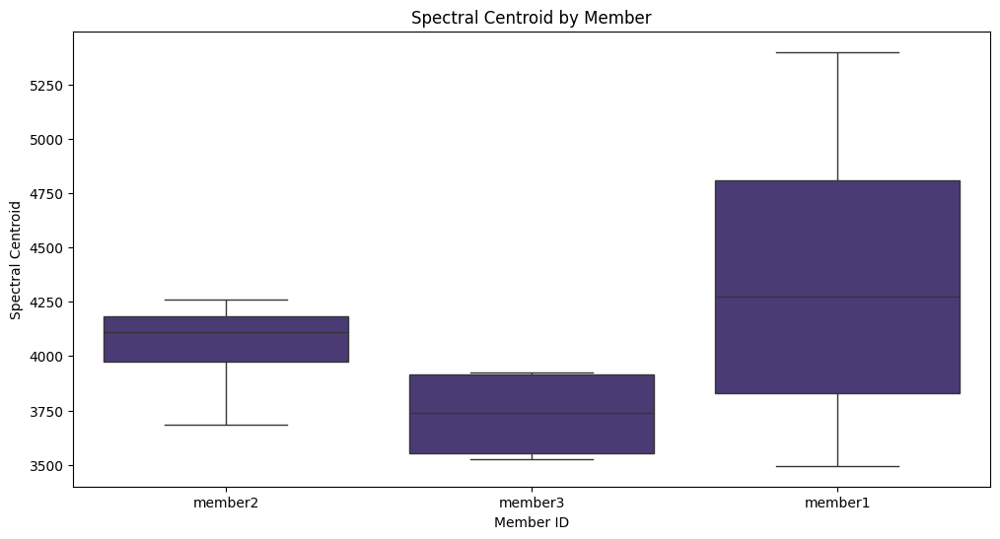

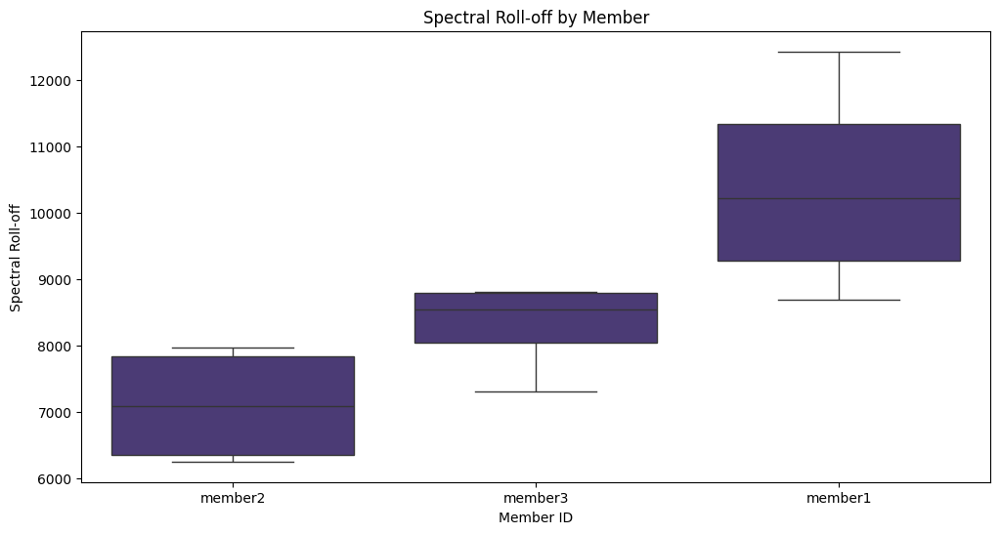

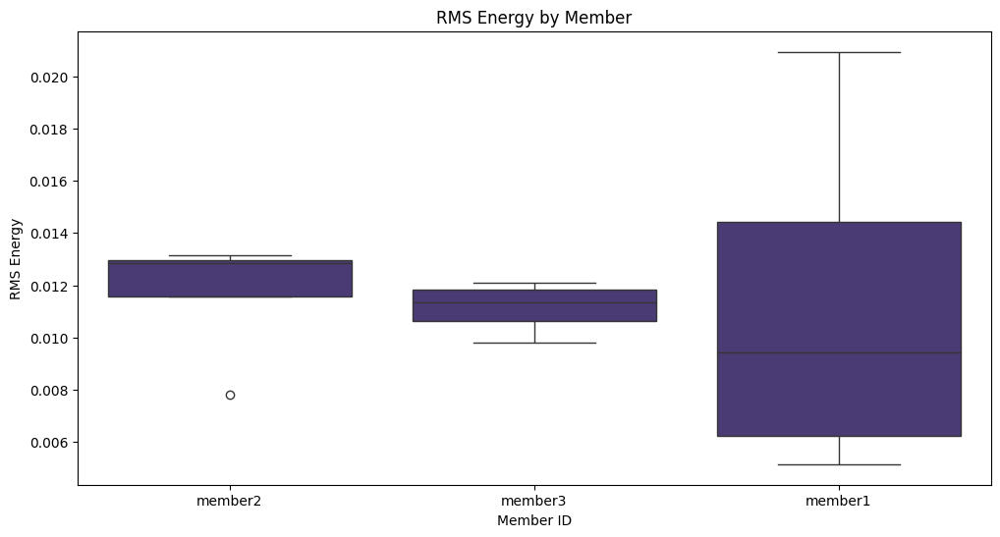

In [26]:
# Filter only original (non-augmented) samples
original_features = audio_features_df[audio_features_df['augmentation'] == 'original']

# Compare features across members
plt.figure(figsize=(12, 6))
sns.boxplot(x='member_id', y='centroid_mean', data=original_features)
plt.title('Spectral Centroid by Member')
plt.ylabel('Spectral Centroid')
plt.xlabel('Member ID')
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(x='member_id', y='rolloff_mean', data=original_features)
plt.title('Spectral Roll-off by Member')
plt.ylabel('Spectral Roll-off')
plt.xlabel('Member ID')
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(x='member_id', y='rms_mean', data=original_features)
plt.title('RMS Energy by Member')
plt.ylabel('RMS Energy')
plt.xlabel('Member ID')
plt.show()

# Model Creation for Multimodal Authentication and Recommendation

In this notebook, we'll develop three models using our engineered and merged datasets:
1. Facial Recognition Model
2. Voiceprint Verification Model
3. Product Recommendation Model

We'll evaluate each model using metrics such as accuracy, F1-score, and loss.

In [27]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import cv2
import librosa
import pickle

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report
from sklearn.pipeline import Pipeline

# Set visualization style
%matplotlib inline
plt.style.use('default')
sns.set_palette('viridis')

## 1. Load Preprocessed Data

First, we'll load the preprocessed data from our previous notebooks.

In [28]:
# Load merged customer data
try:
    merged_customer_data = pd.read_csv('merged_customer_data.csv')
    print("Loaded merged customer data successfully")
    display(merged_customer_data.head())
except FileNotFoundError:
    print("Merged customer data file not found. Please run the data preprocessing notebook first.")

# Load image features
try:
    image_features = pd.read_csv('image_features.csv')
    print("\nLoaded image features successfully")
    display(image_features.head())
except FileNotFoundError:
    print("Image features file not found. Please run the image processing notebook first.")

# Load audio features
try:
    audio_features = pd.read_csv('audio_features.csv')
    print("\nLoaded audio features successfully")
    display(audio_features.head())
except FileNotFoundError:
    print("Audio features file not found. Please run the audio processing notebook first.")

Loaded merged customer data successfully


,customer_id_new,social_media_platform,engagement_score,purchase_interest_score,review_sentiment,customer_id_legacy,transaction_id,purchase_amount,purchase_date,product_category,customer_rating
0,A190,Twitter,82,4.8,Neutral,190,1140,401,2024-05-19,Sports,4.9
1,A150,Facebook,96,1.6,Positive,150,1046,177,2024-02-15,Books,3.6
2,A162,Twitter,89,2.6,Positive,162,1116,343,2024-04-25,Books,1.4
3,A151,TikTok,61,1.3,Neutral,151,1001,408,2024-01-01,Sports,2.3
4,A137,LinkedIn,93,3.5,Neutral,137,1020,286,2024-01-20,Electronics,3.2



Loaded image features successfully


,member_id,expression,hist_0,hist_1,hist_2,hist_3,hist_4,hist_5,hist_6,hist_7,...,hog_10,hog_11,hog_12,hog_13,hog_14,hog_15,hog_16,hog_17,hog_18,hog_19
0,member2,surprised,0.059515,0.132599,0.216040,0.146301,0.103241,0.077842,0.054330,0.050246,...,0.189312,0.103904,0.141526,0.231329,0.194984,0.231329,0.206289,0.074760,0.098017,0.132700
1,member2,surprised_rotated,0.443033,0.103482,0.148472,0.119882,0.086317,0.075357,0.053538,0.049648,...,0.051425,0.278704,0.243365,0.386775,0.013625,0.001874,0.002335,0.004195,0.001003,0.041731
2,member2,surprised_flipped,0.059515,0.132599,0.216040,0.146301,0.103241,0.077842,0.054330,0.050246,...,0.265382,0.222520,0.097621,0.078110,0.018889,0.038442,0.041948,0.140711,0.259774,0.265382
3,member2,smiling,0.082565,0.283038,0.279176,0.163253,0.104848,0.073934,0.052882,0.045316,...,0.140513,0.144437,0.138856,0.174482,0.159952,0.166640,0.207893,0.197869,0.167017,0.100700
4,member2,smiling_rotated,0.486891,0.200722,0.232563,0.141042,0.091971,0.069088,0.049832,0.042454,...,0.054281,0.281610,0.248215,0.378974,0.012449,0.002948,0.004593,0.003558,0.001214,0.036945



Loaded audio features successfully


,member_id,sample_name,augmentation,rolloff_mean,centroid_mean,zcr_mean,rms_mean,mfcc_mean_0,mfcc_mean_1,mfcc_mean_2,...,mfcc_std_3,mfcc_std_4,mfcc_std_5,mfcc_std_6,mfcc_std_7,mfcc_std_8,mfcc_std_9,mfcc_std_10,mfcc_std_11,mfcc_std_12
0,member2,yes_approve_1,original,6390.316901,4068.100178,0.112508,0.012802,-577.798035,27.254427,-8.699362,...,30.346277,17.695181,15.617171,16.639128,14.017076,10.410658,12.232165,11.662311,10.021482,10.662715
1,member2,yes_approve_1,pitched_up,6228.169014,4103.280564,0.133414,0.008473,-597.872253,23.755861,-8.073728,...,31.815369,17.379900,12.470898,16.463907,17.099913,8.247622,10.985608,14.671004,9.358881,6.856793
2,member2,yes_approve_1,pitched_down,5313.512324,3475.845712,0.107513,0.008184,-630.550293,34.720314,-9.716652,...,28.423342,20.327374,18.110792,14.789859,12.500008,15.804294,10.725848,7.621266,13.786709,11.096464
3,member2,yes_approve_1,stretched,6266.436230,4020.429737,0.120041,0.009069,-590.675415,24.325750,-8.081881,...,28.724218,17.049824,14.825067,16.063540,14.202231,10.537534,11.937384,11.515190,9.783486,10.121813
4,member2,yes_approve_1,compressed,6234.454181,3985.698740,0.118870,0.009513,-624.002808,32.102478,-9.318583,...,30.932087,18.108690,15.926853,17.255264,15.355311,11.215828,12.689960,12.576339,10.708135,11.300653


## 2. Facial Recognition Model

We'll build a model to recognize users based on facial features extracted from images.

In [29]:
# Prepare data for facial recognition model
# Filter only original (non-augmented) images
original_images = image_features[~image_features['expression'].str.contains('_')]

# Select features and target
# Use histogram and HOG features
hist_cols = [col for col in original_images.columns if col.startswith('hist_')]
hog_cols = [col for col in original_images.columns if col.startswith('hog_')]

# Combine features
X_face = original_images[hist_cols + hog_cols]
y_face = original_images['member_id']

# Split data into training and testing sets
X_face_train, X_face_test, y_face_train, y_face_test = train_test_split(
    X_face, y_face, test_size=0.2, random_state=42
)

print(f"Training data shape: {X_face_train.shape}")
print(f"Testing data shape: {X_face_test.shape}")

Training data shape: (7, 40)
Testing data shape: (2, 40)


Facial Recognition Model Performance:
Accuracy: 1.0000
F1 Score: 1.0000

Classification Report:
              precision    recall  f1-score   support

     member1       1.00      1.00      1.00         1
     member2       1.00      1.00      1.00         1

    accuracy                           1.00         2
   macro avg       1.00      1.00      1.00         2
weighted avg       1.00      1.00      1.00         2



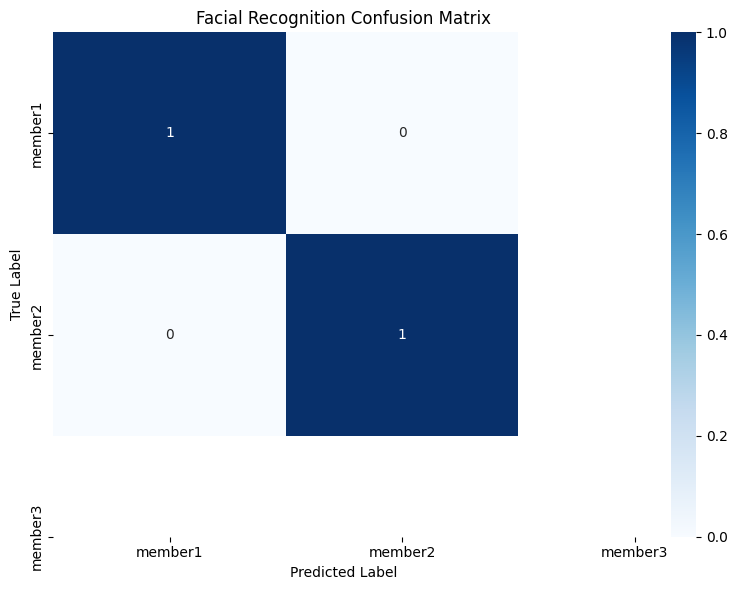

In [30]:
# Build and train facial recognition model
face_model = Pipeline([
    ('scaler', StandardScaler()),
    ('classifier', RandomForestClassifier(n_estimators=100, random_state=42))
])

# Train the model
face_model.fit(X_face_train, y_face_train)

# Make predictions
y_face_pred = face_model.predict(X_face_test)

# Evaluate the model
face_accuracy = accuracy_score(y_face_test, y_face_pred)
face_f1 = f1_score(y_face_test, y_face_pred, average='weighted')

print(f"Facial Recognition Model Performance:")
print(f"Accuracy: {face_accuracy:.4f}")
print(f"F1 Score: {face_f1:.4f}")
print("\nClassification Report:")
print(classification_report(y_face_test, y_face_pred))

# Plot confusion matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_face_test, y_face_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=face_model.classes_, yticklabels=face_model.classes_)
plt.title('Facial Recognition Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.tight_layout()
plt.show()

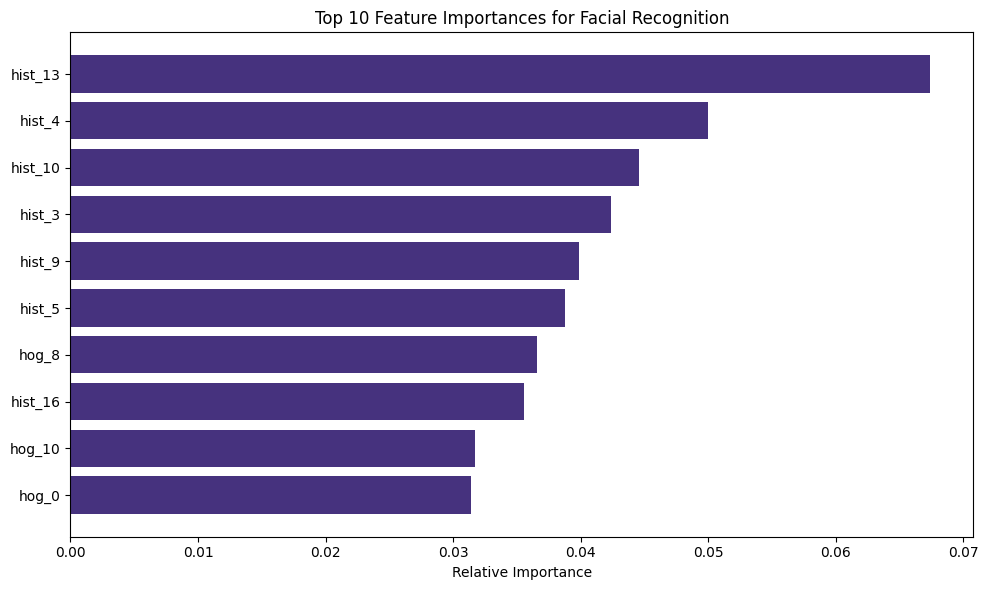

In [31]:
# Feature importance for facial recognition
feature_importances = face_model.named_steps['classifier'].feature_importances_
feature_names = X_face.columns

# Get the top 10 most important features
indices = np.argsort(feature_importances)[-10:]

plt.figure(figsize=(10, 6))
plt.title('Top 10 Feature Importances for Facial Recognition')
plt.barh(range(10), feature_importances[indices], align='center')
plt.yticks(range(10), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.tight_layout()
plt.show()

## 3. Voiceprint Verification Model

We'll build a model to verify users based on voice features extracted from audio samples.

In [32]:
# Prepare data for voiceprint verification model
# Filter only original (non-augmented) audio samples
original_audio = audio_features[audio_features['augmentation'] == 'original']

# Select features and target
# Use MFCC features, spectral features, and energy
mfcc_cols = [col for col in original_audio.columns if col.startswith('mfcc_')]
spectral_cols = ['rolloff_mean', 'centroid_mean', 'zcr_mean', 'rms_mean']

# Combine features
X_voice = original_audio[mfcc_cols + spectral_cols]
y_voice = original_audio['member_id']

# Split data into training and testing sets
X_voice_train, X_voice_test, y_voice_train, y_voice_test = train_test_split(
    X_voice, y_voice, test_size=0.2, random_state=42
)

print(f"Training data shape: {X_voice_train.shape}")
print(f"Testing data shape: {X_voice_test.shape}")

Training data shape: (9, 30)
Testing data shape: (3, 30)


Voiceprint Verification Model Performance:
Accuracy: 1.0000
F1 Score: 1.0000

Classification Report:
              precision    recall  f1-score   support

     member1       1.00      1.00      1.00         2
     member2       1.00      1.00      1.00         1

    accuracy                           1.00         3
   macro avg       1.00      1.00      1.00         3
weighted avg       1.00      1.00      1.00         3



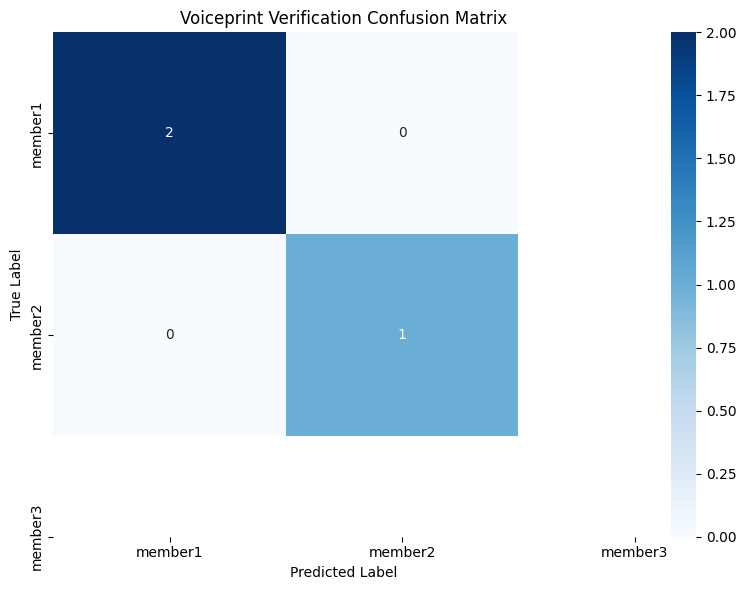

In [33]:
# Build and train voiceprint verification model
voice_model = Pipeline([
    ('scaler', StandardScaler()),
    ('classifier', RandomForestClassifier(n_estimators=100, random_state=42))
])

# Train the model
voice_model.fit(X_voice_train, y_voice_train)

# Make predictions
y_voice_pred = voice_model.predict(X_voice_test)

# Evaluate the model
voice_accuracy = accuracy_score(y_voice_test, y_voice_pred)
voice_f1 = f1_score(y_voice_test, y_voice_pred, average='weighted')

print(f"Voiceprint Verification Model Performance:")
print(f"Accuracy: {voice_accuracy:.4f}")
print(f"F1 Score: {voice_f1:.4f}")
print("\nClassification Report:")
print(classification_report(y_voice_test, y_voice_pred))

# Plot confusion matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_voice_test, y_voice_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=voice_model.classes_, yticklabels=voice_model.classes_)
plt.title('Voiceprint Verification Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.tight_layout()
plt.show()

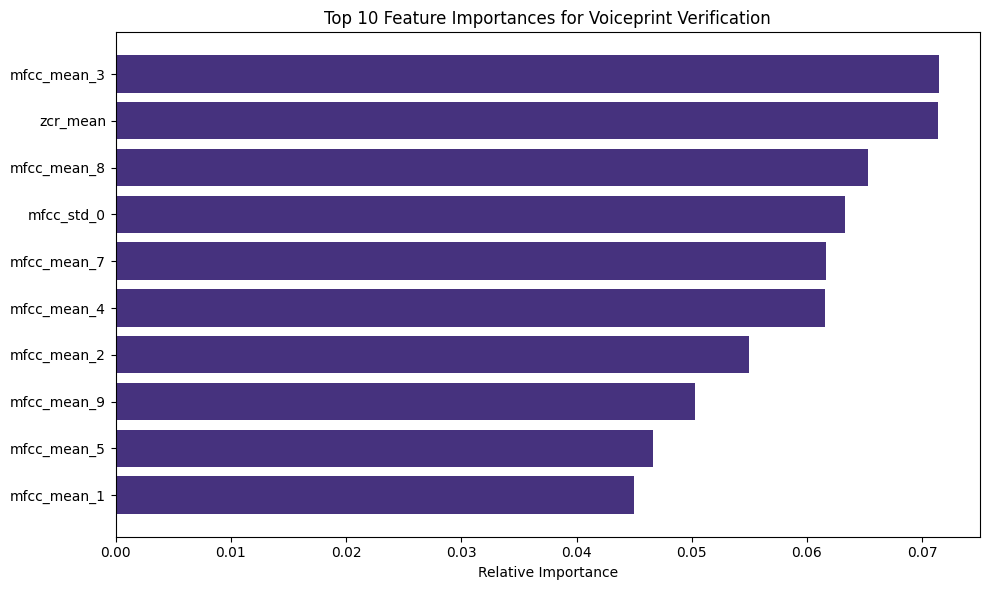

In [34]:
# Feature importance for voiceprint verification
feature_importances = voice_model.named_steps['classifier'].feature_importances_
feature_names = X_voice.columns

# Get the top 10 most important features
indices = np.argsort(feature_importances)[-10:]

plt.figure(figsize=(10, 6))
plt.title('Top 10 Feature Importances for Voiceprint Verification')
plt.barh(range(10), feature_importances[indices], align='center')
plt.yticks(range(10), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.tight_layout()
plt.show()

## 4. Product Recommendation Model

We'll build a model to recommend products based on customer data and transaction history.

In [ ]:

# Use engagement score, purchase interest, and customer rating
X_product = merged_customer_data[['engagement_score', 'purchase_interest_score', 'customer_rating']]
y_product = merged_customer_data['product_category']

# Encode the target variable
label_encoder = LabelEncoder()
y_product_encoded = label_encoder.fit_transform(y_product)

# Split data into training and testing sets
X_product_train, X_product_test, y_product_train, y_product_test = train_test_split(
    X_product, y_product_encoded, test_size=0.2, random_state=42
)

print(f"Training data shape: {X_product_train.shape}")
print(f"Testing data shape: {X_product_test.shape}")
print(f"Product categories: {label_encoder.classes_}")

Training data shape: (48, 3)
Testing data shape: (13, 3)
Product categories: ['Books' 'Clothing' 'Electronics' 'Groceries' 'Sports']


Product Recommendation Model Performance:
Accuracy: 0.2308
F1 Score: 0.2051

Classification Report:
              precision    recall  f1-score   support

       Books       0.00      0.00      0.00         2
    Clothing       0.25      0.50      0.33         2
 Electronics       0.00      0.00      0.00         2
   Groceries       0.00      0.00      0.00         2
      Sports       0.40      0.40      0.40         5

    accuracy                           0.23        13
   macro avg       0.13      0.18      0.15        13
weighted avg       0.19      0.23      0.21        13



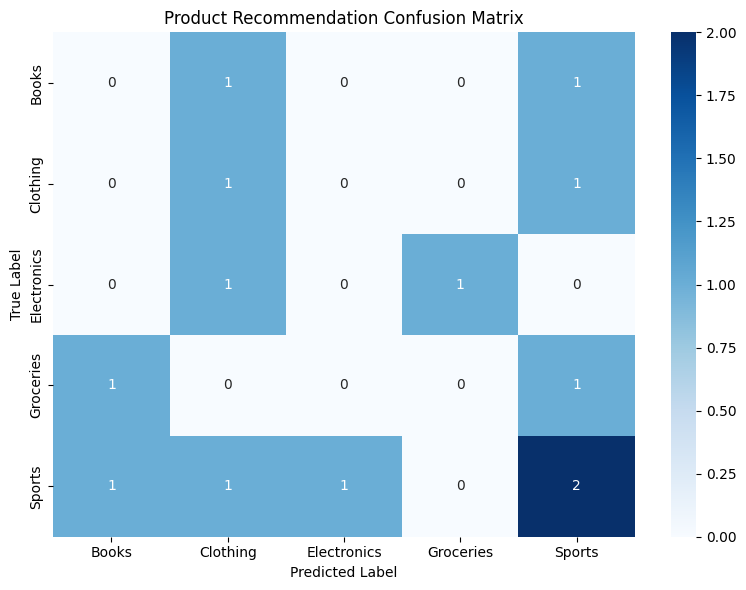

In [36]:
# Build and train product recommendation model
product_model = Pipeline([
    ('scaler', StandardScaler()),
    ('classifier', RandomForestClassifier(n_estimators=100, random_state=42))
])

# Train the model
product_model.fit(X_product_train, y_product_train)

# Make predictions
y_product_pred = product_model.predict(X_product_test)

# Evaluate the model
product_accuracy = accuracy_score(y_product_test, y_product_pred)
product_f1 = f1_score(y_product_test, y_product_pred, average='weighted')

print(f"Product Recommendation Model Performance:")
print(f"Accuracy: {product_accuracy:.4f}")
print(f"F1 Score: {product_f1:.4f}")
print("\nClassification Report:")
print(classification_report(y_product_test, y_product_pred, target_names=label_encoder.classes_))

# Plot confusion matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_product_test, y_product_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.title('Product Recommendation Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.tight_layout()
plt.show()

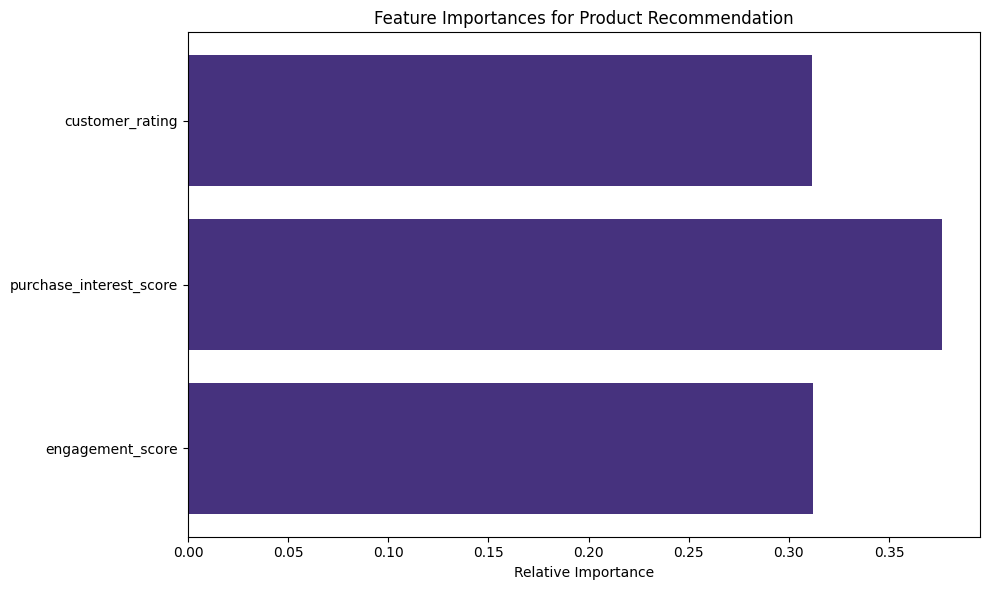

In [37]:
# Feature importance for product recommendation
feature_importances = product_model.named_steps['classifier'].feature_importances_
feature_names = X_product.columns

plt.figure(figsize=(10, 6))
plt.title('Feature Importances for Product Recommendation')
plt.barh(range(len(feature_names)), feature_importances, align='center')
plt.yticks(range(len(feature_names)), feature_names)
plt.xlabel('Relative Importance')
plt.tight_layout()
plt.show()

## 5. Multimodal Authentication and Recommendation System

Now we'll combine the facial recognition and voiceprint verification models to create a multimodal authentication system, which will then trigger the product recommendation model.

In [38]:
# Save the trained models
with open('face_recognition_model.pkl', 'wb') as f:
    pickle.dump(face_model, f)

with open('voiceprint_verification_model.pkl', 'wb') as f:
    pickle.dump(voice_model, f)

with open('product_recommendation_model.pkl', 'wb') as f:
    pickle.dump(product_model, f)
    
with open('product_label_encoder.pkl', 'wb') as f:
    pickle.dump(label_encoder, f)

print("Models saved successfully")

Models saved successfully


## 6. Model Comparison and Evaluation

Let's compare the performance of our three models and discuss the multimodal approach.

Model Performance Comparison:


,Model,Accuracy,F1 Score
0,Facial Recognition,1.000000,1.000000
1,Voiceprint Verification,1.000000,1.000000
2,Product Recommendation,0.230769,0.205128


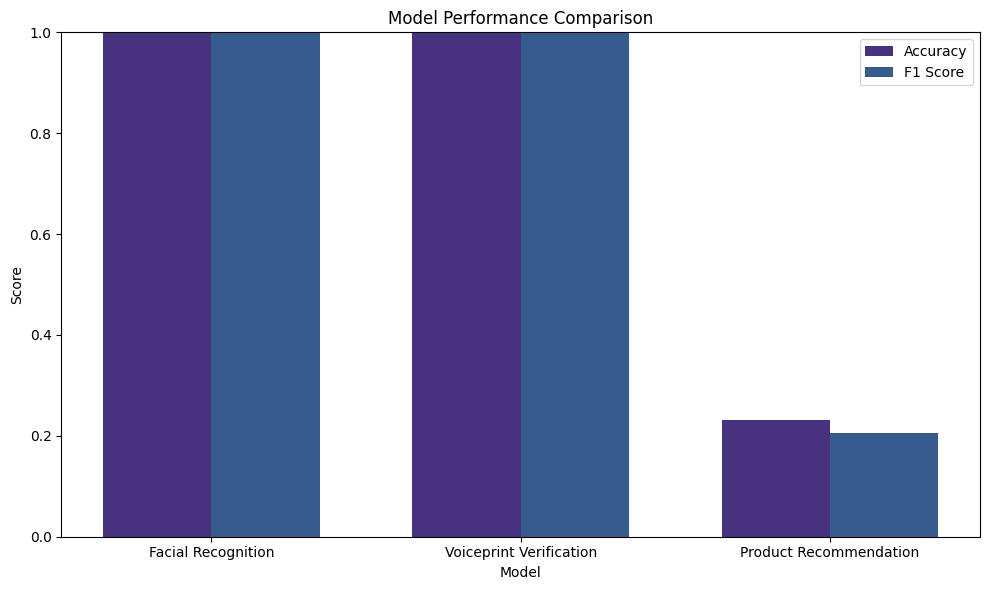

In [39]:
# Compare model performance
models = ['Facial Recognition', 'Voiceprint Verification', 'Product Recommendation']
accuracy_scores = [face_accuracy, voice_accuracy, product_accuracy]
f1_scores = [face_f1, voice_f1, product_f1]

# Create a DataFrame for comparison
comparison_df = pd.DataFrame({
    'Model': models,
    'Accuracy': accuracy_scores,
    'F1 Score': f1_scores
})

print("Model Performance Comparison:")
display(comparison_df)

# Plot comparison
plt.figure(figsize=(10, 6))
x = np.arange(len(models))
width = 0.35

plt.bar(x - width/2, accuracy_scores, width, label='Accuracy')
plt.bar(x + width/2, f1_scores, width, label='F1 Score')

plt.xlabel('Model')
plt.ylabel('Score')
plt.title('Model Performance Comparison')
plt.xticks(x, models)
plt.ylim(0, 1.0)
plt.legend()
plt.tight_layout()
plt.show()